In [1]:
using Pkg
Pkg.activate(pwd())
Pkg.instantiate()
Pkg.status()

  Activating project at `~/Documents/github.com/ucla-biostat-216/2024fall/slides/03-matrix`
Precompiling project...
  ✓ LittleCMS_jll
  ✓ FFTViews
  ✓ TiledIteration
  ✓ ArnoldiMethod
  ✓ OpenJpeg_jll
  ✓ ImageMagick_jll
  ✓ DSP
  ✓ LightGraphs
  ✓ Graphs
  ✓ ImageMagick
  ✓ GraphPlot
  ✓ ImageFiltering
  12 dependencies successfully precompiled in 20 seconds. 323 already precompiled.


Status `~/Documents/github.com/ucla-biostat-216/2024fall/slides/03-matrix/Project.toml`
  [6e4b80f9] BenchmarkTools v1.5.0
  [717857b8] DSP v0.7.10
  [31c24e10] Distributions v0.25.112
  [f6369f11] ForwardDiff v0.10.36
⌃ [a2cc645c] GraphPlot v0.5.2
⌃ [86223c79] Graphs v1.9.0
  [7073ff75] IJulia v1.25.0
  [a09fc81d] ImageCore v0.10.2
  [6a3955dd] ImageFiltering v0.7.8
  [82e4d734] ImageIO v0.6.8
  [4e3cecfd] ImageShow v0.3.8
  [093fc24a] LightGraphs v1.3.5
⌃ [91a5bcdd] Plots v1.40.7
⌅ [f27b6e38] Polynomials v3.2.13
  [928aab9d] SpecialMatrices v3.0.0
  [0c5d862f] Symbolics v6.13.1
  [5e47fb64] TestImages v1.8.0
  [37e2e46d] LinearAlgebra
  [9a3f8284] Random
  [2f01184e] SparseArrays v1.10.0
Info Packages marked with ⌃ and ⌅ have new versions available. Those with ⌃ may be upgradable, but those with ⌅ are restricted by compatibility constraints from upgrading. To see why use `status --outdated`


In [2]:
using BenchmarkTools, Distributions, DSP, ForwardDiff, GraphPlot
using ImageCore, ImageFiltering, ImageIO, ImageShow, Graphs
using LinearAlgebra, Plots, Polynomials, Random, SparseArrays, SpecialMatrices
using Symbolics, TestImages
Random.seed!(216)

TaskLocalRNG()

## Notations and terminology

- A matrix $\mathbf{A} \in \mathbb{R}^{m \times n}$
$$
\mathbf{A} = \begin{pmatrix}
a_{11} & \cdots & a_{1n} \\
\vdots & \ddots & \vdots \\
a_{m1} & \cdots & a_{mn}
\end{pmatrix}.
$$
    - $a_{ij}$ are the matrix **elements** or **entries** or **coefficients** or **components**.  
    - **Size** or **dimension** of the matrix is $m \times n$.  

- Many authors use square brackets:
$$
\mathbf{A} = \begin{bmatrix}
a_{11} & \cdots & a_{1n} \\
\vdots & \ddots & \vdots \\
a_{m1} & \cdots & a_{mn}
\end{bmatrix}.
$$

In [3]:
# a 3x4 matrix
A = [0 1 -2.3 0.1;
    1.3 4 -0.1 0;
    4.1 -1 0 1.7]

3×4 Matrix{Float64}:
 0.0   1.0  -2.3  0.1
 1.3   4.0  -0.1  0.0
 4.1  -1.0   0.0  1.7

- We say a matrix $\mathbf{A} \in \mathbb{R}^{m \times n}$ is
    - **tall** if $m > n$;
    - **wide** if $m < n$;
    - **square** if $m = n$

In [4]:
# a tall matrix
A = randn(5, 3)

5×3 Matrix{Float64}:
  1.27293    -1.24595    0.0726842
 -0.0716618   0.881297  -0.882397
 -0.445158   -1.5708    -0.206524
  0.45854    -0.675163   0.644471
  0.100877    0.154779   0.355693

In [5]:
# a wide matrix
A = randn(2, 4)

2×4 Matrix{Float64}:
 -0.0459504  2.93595    0.370414  -0.340719
  0.880636   0.984133  -1.15965    2.05071

In [6]:
# a square matrix
A = randn(3, 3)

3×3 Matrix{Float64}:
 0.218035  -1.98768    2.0314
 0.817998   0.685054  -0.368744
 0.738937   0.30786   -0.606762

- **Block matrix** is a rectangular array of matrices
$$
\mathbf{A} = \begin{pmatrix}
\mathbf{B} & \mathbf{C} \\
\mathbf{D} & \mathbf{E}
\end{pmatrix}.
$$
Elements in the block matrices are the **blocks** or **submatrices**. Dimensions of the blocks must be compatible.

In [7]:
# blocks
B = [2; 1] # 2x1
C = [0 2 3; 5 4 7] # 2x3
D = [1] # 1x1
E = [-1 6 0] # 1x3
# block matrix
A = [B C; D E]

3×4 Matrix{Int64}:
 2   0  2  3
 1   5  4  7
 1  -1  6  0

- Matrix $\mathbf{A} \in \mathbb{R}^{m \times n}$ can be viewed as a $1 \times n$ block matrix with each column as a block
$$
\mathbf{A} = \begin{pmatrix}
\mathbf{a}_1 & \cdots & \mathbf{a}_n
\end{pmatrix},
$$
where 
$$
\mathbf{a}_j = \begin{pmatrix} a_{1j} \\ \vdots \\ a_{mj} \end{pmatrix}
$$
is the $j$-th column of $\mathbf{A}$.

- $\mathbf{A} \in \mathbb{R}^{m \times n}$ viewed as an $m \times 1$ block matrix with each row as a block
$$
\mathbf{A} = \begin{pmatrix}
\mathbf{b}_1' \\
\vdots \\
\mathbf{b}_m'
\end{pmatrix},
$$
where
$$
\mathbf{b}_i' = \begin{pmatrix} a_{i1} \, \cdots \, a_{in} \end{pmatrix}
$$
is the $i$-th row of $\mathbf{A}$.

- Submatrix: $\mathbf{A}_{i_1:i_2,j_1:j_2}$ or $\mathbf{A}[i_1:i_2, j_1:j_2]$.

In [8]:
A = [0 1 -2.3 0.1;
    1.3 4 -0.1 0;
    4.1 -1 0 1.7]

3×4 Matrix{Float64}:
 0.0   1.0  -2.3  0.1
 1.3   4.0  -0.1  0.0
 4.1  -1.0   0.0  1.7

In [9]:
# sub-array
A[2:3, 2:3]

2×2 Matrix{Float64}:
  4.0  -0.1
 -1.0   0.0

In [10]:
# a row
A[3, :]

4-element Vector{Float64}:
  4.1
 -1.0
  0.0
  1.7

In [11]:
# a column
A[:, 3]

3-element Vector{Float64}:
 -2.3
 -0.1
  0.0

## Some special matrices

- **Zero matrix** $\mathbf{0}_{m \times n} \in \mathbb{R}^{m \times n}$ is the matrix with all entries $a_{ij}=0$. The subscript is sometimes omitted when the dimension is clear from context.

- **One matrix** $\mathbf{1}_{m \times n} \in \mathbb{R}^{m \times n}$ is the  matrix with all entries $a_{ij}=1$. It is often written as $\mathbf{1}_m \mathbf{1}_n'$. 

- **Identity matrix** $\mathbf{I}_n \in \mathbb{R}^{n \times n}$ has entries $a_{ij} = \delta_{ij}$ (Kronecker delta notation):
$$
\mathbf{I}_n = \begin{pmatrix} 1 & \cdots & 0 \\
\vdots & \ddots & \vdots \\
0 & \cdots & 1
\end{pmatrix}.
$$
The subscript is often omitted when the dimension is clear from context. The columns of $\mathbf{A}$ are the unit vectors
$$
\mathbf{I}_n = \begin{pmatrix} \mathbf{e}_1 \, \mathbf{e}_2 \, \cdots \, \mathbf{e}_n \end{pmatrix}.
$$
Identity matrix is called the **uniform scaling** in some computer languages.

In [12]:
# a 3x5 zero matrix
zeros(3, 5)

3×5 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0

In [13]:
# a 3x5 one matrix
ones(3, 5)

3×5 Matrix{Float64}:
 1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0

In [14]:
@show ones(3, 5) == ones(3) * ones(5)'

ones(3, 5) == ones(3) * (ones(5))' = true


true

In [15]:
# uniform scaling
I

UniformScaling{Bool}
true*I

In [16]:
# a 3x3 identity matrix
I(3)

3×3 Diagonal{Bool, Vector{Bool}}:
 1  ⋅  ⋅
 ⋅  1  ⋅
 ⋅  ⋅  1

In [17]:
# convert to dense matrix
Matrix(I(3))

3×3 Matrix{Bool}:
 1  0  0
 0  1  0
 0  0  1

- **Symmetric matrix** is a square matrix $\mathbf{A}$ with $a_{ij} = a_{ji}$.

In [18]:
# a symmetric matrix
A = [4 3 -2; 3 -1 5; -2 5 0]

3×3 Matrix{Int64}:
  4   3  -2
  3  -1   5
 -2   5   0

In [19]:
issymmetric(A)

true

In [20]:
# turn a general square matrix into a symmetric matrix
A = randn(3, 3)

3×3 Matrix{Float64}:
  0.652664  -1.50275   -1.79446
 -0.261668  -2.37219    1.15214
 -1.01783   -0.681828  -1.02284

In [21]:
# use upper triangular part as data
Symmetric(A)

3×3 Symmetric{Float64, Matrix{Float64}}:
  0.652664  -1.50275  -1.79446
 -1.50275   -2.37219   1.15214
 -1.79446    1.15214  -1.02284

In [22]:
# use lower triangular part as data
Symmetric(A, :L)

3×3 Symmetric{Float64, Matrix{Float64}}:
  0.652664  -0.261668  -1.01783
 -0.261668  -2.37219   -0.681828
 -1.01783   -0.681828  -1.02284

- A **diagonal matrix** is a square matrix $\mathbf{A}$ with $a_{ij} = 0$ for all $i \ne j$.

In [23]:
# a diagonal matrix
A = [-1 0 0; 0 2 0; 0 0 -5]

3×3 Matrix{Int64}:
 -1  0   0
  0  2   0
  0  0  -5

In [24]:
# turn a general square matrix into a diagonal matrix
Diagonal(A)

3×3 Diagonal{Int64, Vector{Int64}}:
 -1  ⋅   ⋅
  ⋅  2   ⋅
  ⋅  ⋅  -5

- A **lower triangular matrix** is a square matrix $\mathbf{A}$ with $a_{ij} = 0$ for all $i < j$.

- A **upper triangular matrix** is a square matrix $\mathbf{A}$ with $a_{ij} = 0$ for all $i > j$.

In [25]:
# a lower triangular matrix
A = [4 0 0; 3 -1 0; -1 5 -2]

3×3 Matrix{Int64}:
  4   0   0
  3  -1   0
 -1   5  -2

In [26]:
# turn a general square matrix into a lower triangular matrix
A = randn(3, 3)
LowerTriangular(A)

3×3 LowerTriangular{Float64, Matrix{Float64}}:
 -0.255073    ⋅         ⋅ 
  0.542768   0.377846   ⋅ 
 -1.58849   -0.980558  0.162718

In [27]:
# turn a general square matrix into an upper triangular matrix
UpperTriangular(A)

3×3 UpperTriangular{Float64, Matrix{Float64}}:
 -0.255073  2.14277   -0.921703
   ⋅        0.377846   0.609551
   ⋅         ⋅         0.162718

- A **unit lower triangular matrix** is a square matrix $\mathbf{A}$ with $a_{ij} = 0$ for all $i < j$ and $a_{ii}=1$.

- A **unit upper triangular matrix** is a square matrix $\mathbf{A}$ with $a_{ij} = 0$ for all $i > j$ and $a_{ii}=1$.

In [28]:
# turn a general square matrix into a unit lower triangular matrix
UnitLowerTriangular(A)

3×3 UnitLowerTriangular{Float64, Matrix{Float64}}:
  1.0         ⋅         ⋅ 
  0.542768   1.0        ⋅ 
 -1.58849   -0.980558  1.0

In [29]:
# turn a general square matrix into a unit upper triangular matrix
UnitUpperTriangular(A)

3×3 UnitUpperTriangular{Float64, Matrix{Float64}}:
 1.0  2.14277  -0.921703
  ⋅   1.0       0.609551
  ⋅    ⋅        1.0

- We say a matrix is **sparse** if most (almost all) of its elements are zero.

    - In computer, a sparse matrix only stores the non-zero entries and their positions. 
    
    - Special algorithms exploit the sparsity. Efficiency depends on number of nonzeros and their positions.
    
    - Sparse matrix can be visualized by the **spy plot**. 

In [30]:
# generate a random 50x120 sparse matrix, with sparsity level 0.05
A = sprandn(50, 120, 0.05)

50×120 SparseMatrixCSC{Float64, Int64} with 305 stored entries:
⎡⠀⠢⢀⠘⠀⠀⢀⡀⠈⠀⠈⠀⠘⠐⢀⠐⠠⠀⢠⠃⡀⠀⠀⠀⠂⡐⠀⢄⠀⠂⠀⠀⠀⡐⡂⠀⡀⠁⠐⠀⎤
⎢⠠⠀⠀⠐⠈⢈⠀⠐⠈⠤⢀⢀⡠⠈⠀⠡⡀⠀⡉⠈⠁⠢⠄⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⡀⠀⠁⠐⠀⎥
⎢⠀⠀⠠⠠⠀⠀⠀⠁⠀⠀⠀⠀⢀⠂⠀⠀⡠⠨⡀⠄⠀⠀⠁⡄⠀⠁⠂⠀⡉⠀⠐⡀⠄⠠⠀⢀⠁⠩⠌⠂⎥
⎢⠅⢀⡀⠀⢀⠀⠐⠐⠀⠀⠂⠀⠘⢀⠀⠥⠁⠀⠠⢡⠁⠄⡲⠀⠁⢀⠤⠄⠤⠀⠒⠃⠅⠀⠄⠀⠀⠄⠁⠀⎥
⎢⠄⢀⢀⠠⠐⠨⠀⡀⠨⠀⢀⡀⠂⠀⢀⠁⠰⠀⠉⠀⠀⠀⡅⠄⡀⠀⠀⠀⠅⠌⠠⠀⠀⠀⡀⠈⠈⠀⠀⠑⎥
⎢⠎⡀⠀⢠⠀⠀⠀⠀⡈⠀⠀⠐⡈⠀⠀⠢⠀⠀⠀⠠⠁⠁⠁⠀⡇⠄⠌⠀⡁⠐⠁⠅⠄⠂⠀⠀⢀⠌⡀⠁⎥
⎢⢐⠡⠂⠘⠀⠐⠀⠁⢀⠀⠂⡀⡀⢐⡀⢀⣠⠐⢈⠨⡂⠈⡈⢐⠅⠈⠐⠀⠀⢁⠂⠀⡁⠈⠀⠄⠀⠐⠀⠂⎥
⎢⡀⠀⢀⠠⠀⠀⠀⠁⢀⢀⠀⢠⠐⠐⠀⢐⠁⡈⢂⢒⢀⠀⠀⡂⠀⠀⠂⣀⠀⠰⠀⠀⠒⠀⠂⠁⠄⠈⡅⠁⎥
⎣⠀⠀⠀⠀⠈⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠁⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠀⠀⎦

In [31]:
# show contents of SparseMatrixCSC{Bool, Int64}
dump(A)

SparseMatrixCSC{Float64, Int64}
  m: Int64 50
  n: Int64 120
  colptr: Array{Int64}((121,)) [1, 7, 7, 11, 14, 15, 18, 20, 21, 24  …  279, 280, 284, 290, 296, 297, 300, 301, 305, 306]
  rowval: Array{Int64}((305,)) [19, 22, 29, 33, 35, 48, 10, 32, 39, 42  …  47, 2, 8, 13, 15, 26, 31, 40, 44, 27]
  nzval: Array{Float64}((305,)) [-0.14685500525431033, 0.47200960399296804, 0.657048798141254, 0.39288873583359996, 0.0985905881448263, 0.7488769080170825, -1.2094145518697006, 0.056402385534404666, -1.178107103701229, -0.48917307225830825  …  -0.6426634211004807, 1.3164205043849353, -1.0674480541079694, 0.23898374861942337, 0.8987852360274996, -0.5134205668839702, 0.49398677661431006, 0.5474351175813601, -0.6868925426002421, -1.3854649923798028]


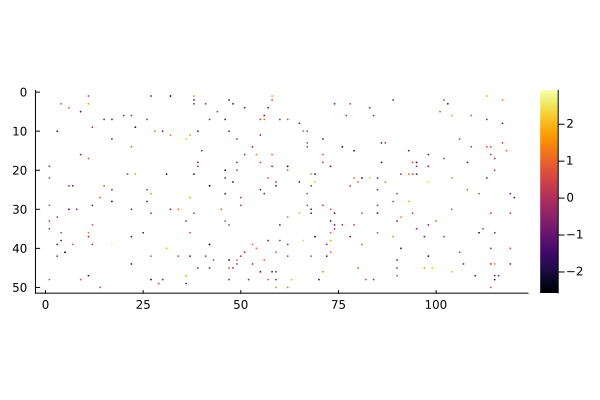

In [32]:
Plots.spy(A)

## Matrix operations

- **Scalar-matrix multiplication** or **scalar-matrix product**: For $\beta \in \mathbb{R}$ and $\mathbf{A} \in \mathbb{R}^{m \times n}$,
$$
\beta \mathbf{A} = \begin{pmatrix}
\beta a_{11} & \cdots & \beta a_{1n} \\
\vdots & \ddots & \vdots \\
\beta a_{m1} & \cdots & \beta a_{mn}
\end{pmatrix}.
$$

In [33]:
β = 0.5
A = [0 1 -2.3 0.1;
    1.3 4 -0.1 0;
    4.1 -1 0 1.7]

3×4 Matrix{Float64}:
 0.0   1.0  -2.3  0.1
 1.3   4.0  -0.1  0.0
 4.1  -1.0   0.0  1.7

In [34]:
β * A

3×4 Matrix{Float64}:
 0.0    0.5  -1.15  0.05
 0.65   2.0  -0.05  0.0
 2.05  -0.5   0.0   0.85

- **Matrix addition and substraction**: For $\mathbf{A}, \mathbf{B} \in \mathbb{R}^{m \times n}$,
$$
\mathbf{A} + \mathbf{B} = \begin{pmatrix}
a_{11} + b_{11} & \cdots & a_{1n} + b_{1n} \\
\vdots & \ddots & \vdots \\
a_{m1} + b_{m1} & \cdots & a_{mn} + b_{mn}
\end{pmatrix}, \quad \mathbf{A} - \mathbf{B} = \begin{pmatrix}
a_{11} - b_{11} & \cdots & a_{1n} - b_{1n} \\
\vdots & \ddots & \vdots \\
a_{m1} - b_{m1} & \cdots & a_{mn} - b_{mn}
\end{pmatrix}.
$$ 

In [35]:
A = [0 1 -2.3 0.1;
    1.3 4 -0.1 0;
    4.1 -1 0 1.7]

3×4 Matrix{Float64}:
 0.0   1.0  -2.3  0.1
 1.3   4.0  -0.1  0.0
 4.1  -1.0   0.0  1.7

In [36]:
B = ones(size(A))

3×4 Matrix{Float64}:
 1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0

In [37]:
A + B

3×4 Matrix{Float64}:
 1.0  2.0  -1.3  1.1
 2.3  5.0   0.9  1.0
 5.1  0.0   1.0  2.7

In [38]:
A - B

3×4 Matrix{Float64}:
 -1.0   0.0  -3.3  -0.9
  0.3   3.0  -1.1  -1.0
  3.1  -2.0  -1.0   0.7

- Composition of scalar-matrix product and and matrix addition/substraction is linear combination of matrices of same size
$$
\alpha_1 \mathbf{A}_1 + \cdots + \alpha_k \mathbf{A}_k
$$
One example of linear combination of matrices is color-image-to-grayscale-image conversion.

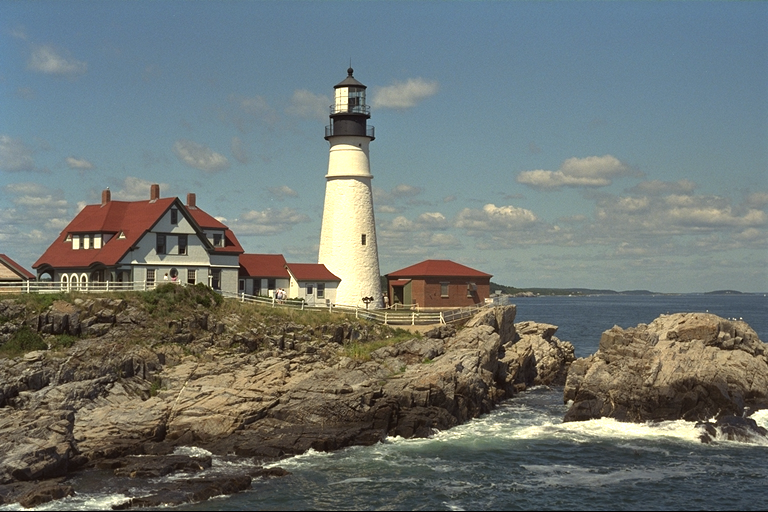

In [39]:
rgb_image = testimage("lighthouse")

In [40]:
# R(ed) channel
channelview(rgb_image)[1, :, :]

512×768 Array{N0f8,2} with eltype N0f8:
 0.361  0.349  0.345  0.376  0.369  …  0.349  0.341  0.329  0.345  0.349
 0.361  0.361  0.361  0.361  0.361     0.349  0.361  0.357  0.349  0.369
 0.376  0.353  0.361  0.361  0.369     0.361  0.357  0.357  0.349  0.361
 0.365  0.369  0.365  0.361  0.353     0.349  0.345  0.349  0.353  0.345
 0.365  0.376  0.361  0.365  0.365     0.357  0.361  0.361  0.361  0.349
 0.369  0.376  0.365  0.365  0.369  …  0.369  0.369  0.357  0.365  0.365
 0.38   0.365  0.369  0.365  0.365     0.369  0.361  0.361  0.361  0.365
 0.369  0.365  0.353  0.369  0.365     0.357  0.361  0.361  0.349  0.376
 0.357  0.376  0.388  0.369  0.369     0.357  0.361  0.361  0.369  0.373
 0.349  0.376  0.38   0.388  0.369     0.369  0.376  0.373  0.369  0.373
 0.373  0.376  0.376  0.38   0.369  …  0.369  0.376  0.376  0.361  0.353
 0.388  0.369  0.369  0.38   0.38      0.369  0.361  0.361  0.349  0.361
 0.38   0.388  0.376  0.369  0.376     0.361  0.373  0.349  0.353  0.376
 ⋮         

In [41]:
# G(reen) channel
channelview(rgb_image)[2, :, :]

512×768 Array{N0f8,2} with eltype N0f8:
 0.486  0.475  0.478  0.514  0.506  …  0.486  0.475  0.463  0.482  0.49
 0.486  0.498  0.494  0.498  0.498     0.482  0.49   0.486  0.482  0.498
 0.514  0.49   0.494  0.494  0.506     0.49   0.482  0.482  0.486  0.498
 0.498  0.506  0.498  0.494  0.49      0.478  0.471  0.475  0.49   0.478
 0.498  0.51   0.494  0.498  0.498     0.482  0.49   0.486  0.498  0.486
 0.502  0.51   0.498  0.498  0.506  …  0.494  0.494  0.482  0.502  0.502
 0.518  0.498  0.506  0.498  0.498     0.494  0.49   0.486  0.498  0.502
 0.502  0.498  0.49   0.506  0.498     0.482  0.486  0.486  0.475  0.502
 0.502  0.51   0.522  0.506  0.506     0.482  0.486  0.486  0.494  0.498
 0.49   0.51   0.518  0.522  0.506     0.49   0.502  0.498  0.494  0.498
 0.518  0.51   0.514  0.518  0.514  …  0.482  0.506  0.506  0.498  0.494
 0.533  0.506  0.506  0.518  0.518     0.494  0.49   0.49   0.486  0.498
 0.525  0.522  0.51   0.502  0.51      0.49   0.498  0.475  0.49   0.514
 ⋮          

In [42]:
# B(lue) channel
channelview(rgb_image)[3, :, :]

512×768 Array{N0f8,2} with eltype N0f8:
 0.6    0.588  0.588  0.624  0.616  …  0.537  0.525  0.518  0.525  0.529
 0.6    0.608  0.616  0.608  0.608     0.557  0.576  0.569  0.565  0.58
 0.624  0.608  0.616  0.616  0.616     0.592  0.588  0.596  0.596  0.608
 0.62   0.624  0.62   0.616  0.608     0.58   0.576  0.588  0.6    0.588
 0.627  0.639  0.616  0.62   0.62      0.596  0.592  0.6    0.608  0.596
 0.635  0.631  0.62   0.62   0.624  …  0.596  0.596  0.596  0.612  0.612
 0.635  0.62   0.624  0.62   0.62      0.596  0.592  0.6    0.608  0.612
 0.635  0.62   0.608  0.624  0.62      0.596  0.6    0.6    0.588  0.616
 0.627  0.631  0.631  0.624  0.624     0.596  0.6    0.6    0.596  0.604
 0.62   0.631  0.627  0.643  0.624     0.608  0.616  0.604  0.596  0.604
 0.643  0.631  0.624  0.635  0.631  …  0.592  0.608  0.608  0.596  0.592
 0.659  0.624  0.624  0.635  0.635     0.596  0.592  0.592  0.596  0.608
 0.643  0.651  0.639  0.635  0.631     0.592  0.604  0.588  0.6    0.624
 ⋮          

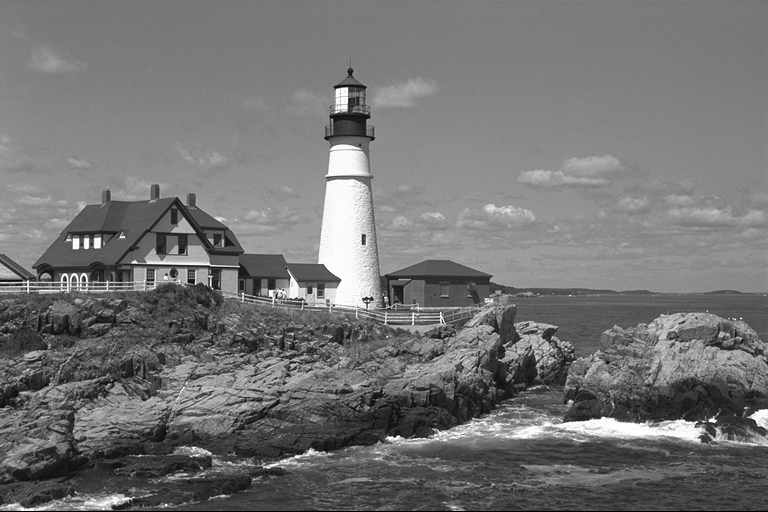

In [43]:
gray_image = Gray.(rgb_image)

In [44]:
channelview(gray_image)

512×768 reinterpret(reshape, N0f8, ::Array{Gray{N0f8},2}) with eltype N0f8:
 0.463  0.451  0.451  0.486  0.478  …  0.451  0.439  0.427  0.447  0.451
 0.463  0.471  0.467  0.471  0.471     0.451  0.463  0.459  0.451  0.471
 0.486  0.463  0.467  0.467  0.478     0.463  0.459  0.459  0.459  0.471
 0.471  0.478  0.471  0.467  0.463     0.451  0.447  0.451  0.463  0.451
 0.475  0.486  0.467  0.471  0.471     0.459  0.463  0.463  0.471  0.459
 0.478  0.482  0.471  0.471  0.478  …  0.467  0.467  0.459  0.475  0.475
 0.49   0.471  0.478  0.471  0.471     0.467  0.463  0.463  0.471  0.475
 0.478  0.471  0.463  0.478  0.471     0.459  0.463  0.463  0.451  0.478
 0.475  0.482  0.494  0.478  0.478     0.459  0.463  0.463  0.467  0.475
 0.463  0.482  0.49   0.494  0.478     0.467  0.478  0.475  0.467  0.475
 0.49   0.482  0.486  0.49   0.482  …  0.463  0.478  0.478  0.467  0.463
 0.506  0.478  0.478  0.49   0.49      0.467  0.463  0.463  0.459  0.471
 0.494  0.498  0.486  0.478  0.482     0.463  0.

The gray image are computed by taking a linear combination of the R(ed), G(green), and B(lue) channels.
$$
0.299 \mathbf{R} + 0.587 \mathbf{G} + 0.114 \mathbf{B}
$$
according to [Rec. ITU-R BT.601-7](https://www.itu.int/dms_pubrec/itu-r/rec/bt/R-REC-BT.601-7-201103-I!!PDF-E.pdf).

In [45]:
@show 0.299 * channelview(rgb_image)[1, 1, 1] + 
    0.587 * channelview(rgb_image)[2, 1, 1] + 
    0.114 * channelview(rgb_image)[3, 1, 1]
@show channelview(gray_image)[1, 1];

0.299 * (channelview(rgb_image))[1, 1, 1] + 0.587 * (channelview(rgb_image))[2, 1, 1] + 0.114 * (channelview(rgb_image))[3, 1, 1] = 0.4617176470588235
(channelview(gray_image))[1, 1] = 0.463N0f8


In [46]:
# first pixel
rgb_image[1]

In [47]:
# first pixel converted to gray scale
Gray{N0f8}(0.299 * rgb_image[1].r + 0.587 * rgb_image[1].g + 0.114 * rgb_image[1].b)

- The **transpose** of a matrix $\mathbf{A} \in \mathbb{R}^{m \times n}$ is the $n \times m$ matrix
$$
\mathbf{A}' = \begin{pmatrix}
a_{11} & \cdots & a_{m1} \\
\vdots & \ddots & \vdots \\
a_{1n} & \cdots & a_{mn}
\end{pmatrix}.
$$
In words, we swap $a_{ij} \leftrightarrow a_{ji}$ for all $i, j$.

- Alternative notation: $\mathbf{A}^T$, $\mathbf{A}^t$.

- Properties of matrix transpose:

    - A symmetric matrix satisfies $\mathbf{A} = \mathbf{A}'$.

    - $(\beta \mathbf{A})' = \beta \mathbf{A}'$.

    - $(\mathbf{A} + \mathbf{B})' = \mathbf{A}' + \mathbf{B}'$.

In [48]:
A

3×4 Matrix{Float64}:
 0.0   1.0  -2.3  0.1
 1.3   4.0  -0.1  0.0
 4.1  -1.0   0.0  1.7

In [49]:
A'

4×3 adjoint(::Matrix{Float64}) with eltype Float64:
  0.0   1.3   4.1
  1.0   4.0  -1.0
 -2.3  -0.1   0.0
  0.1   0.0   1.7

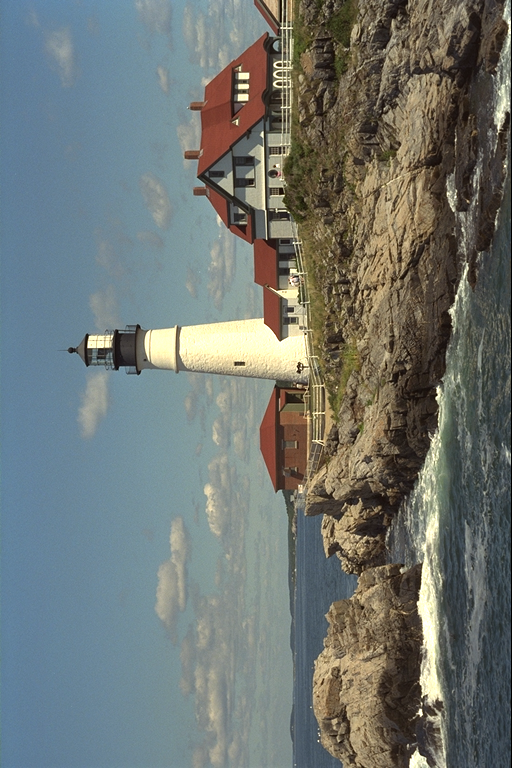

In [50]:
# note it's not rotating the picture!
rgb_image'

- Transpose a block matrix
$$
\begin{pmatrix}
\mathbf{A} & \mathbf{B} \\
\mathbf{C} & \mathbf{D}
\end{pmatrix}' = \begin{pmatrix}
\mathbf{A}' & \mathbf{C}' \\
\mathbf{B}' & \mathbf{D}'
\end{pmatrix}.
$$

## Matrix norm

- The **(Frobenius) norm** or **norm** of a matrix $\mathbf{A} \in \mathbb{R}^{m \times n}$ is defined as
$$
\|\mathbf{A}\| = \sqrt{\sum_{i,j} a_{ij}^2}.
$$
Often we use $\|\mathbf{A}\|_{\text{F}}$ to differentiate with other matrix norms.

- Define the $\operatorname{vec}$ operator that stacks the columns of a matrix into a long vector

$$
\operatorname{vec} \mathbf{A} = \begin{pmatrix}
a_{11} \\
\vdots \\
a_{m1} \\
\vdots \\
a_{1n} \\
\vdots \\
a_{mn}
\end{pmatrix}.
$$
It is easy to see that $\|\mathbf{A}\| = \|\operatorname{vec} \mathbf{A}\|$.

- Similar to the vector norm, matrix norm satisfies the following properties:

    1. Positive definiteness: $\|\mathbf{A}\| \ge 0$. $\|\mathbf{A}\| = 0$ if and only if $\mathbf{A}=\mathbf{0}_{m \times n}$.
    
    2. Homogeneity: $\|\alpha \mathbf{A}\| = |\alpha| \|\mathbf{A}\|$ for any scalar $\alpha$ and matrix $\mathbf{A}$.  
    
    3. Triangle inequality: $\|\mathbf{A} + \mathbf{B}\| \le \|\mathbf{A}\| + \|\mathbf{B}\|$ for any $\mathbf{A}, \mathbf{B} \in \mathbb{R}^{m \times n}$.  Proof: TODO in class.
    
    4. A new rule for (any) matrix norm: $\|\mathbf{A} \mathbf{B}\| \le \|\mathbf{A}\| \|\mathbf{B}\|$. Proof: HW2.

In [51]:
A = [0 1 -2.3 0.1;
    1.3 4 -0.1 0;
    4.1 -1 0 1.7]

3×4 Matrix{Float64}:
 0.0   1.0  -2.3  0.1
 1.3   4.0  -0.1  0.0
 4.1  -1.0   0.0  1.7

In [52]:
# Frobenius norm 
norm(A)

6.685805860178712

In [53]:
# manually calculate Frobenius norm
sqrt(sum(abs2, A))

6.685805860178712

## Matrix-matrix and matrix-vector multiplications

### Matrix-matrix multiplication

- **Matrix-matrix multiplication** or **matrix-matrix product**: For $\mathbf{A} \in \mathbb{R}^{m \times n}$ and $\mathbf{B} \in \mathbb{R}^{n \times p}$,
$$
\mathbf{C} = \mathbf{A} \mathbf{B}
$$
is the $m \times p$ matrix with entries
$$
c_{ij} = a_{i1} b_{1j} + a_{i2} b_{2k} + \cdots + a_{in} b_{nj} = \sum_{k=1}^n a_{ik} b_{kj}.
$$
Note the number of columns in $\mathbf{A}$ must be equal to the number of rows in $\mathbf{B}$.

- Vector inner product $\mathbf{a}' \mathbf{b}$ is a special case of matrix-matrix multiplication with $m=p=1$.
$$
\mathbf{a}' \mathbf{b} = \begin{pmatrix} a_1 \, \cdots \, a_n \end{pmatrix} \begin{pmatrix} b_1 \\ \vdots \\ b_n \end{pmatrix} = \sum_{i=1}^n a_i b_i.
$$

- View of matrix-matrix multiplication as inner products. $c_{ij}$ is the inner product of the $i$-th row of $\mathbf{A}$ and the $j$-th column of $\mathbf{B}$:
$$
\begin{pmatrix}
& & \\
& c_{ij} & \\
& & 
\end{pmatrix} = \begin{pmatrix}
& & \\ - & \mathbf{a}_i' & - \\ & &
\end{pmatrix} \begin{pmatrix}
& | & \\
& \mathbf{b}_j & \\
& | &
\end{pmatrix} = \begin{pmatrix}
& & \\
a_{i1} & \cdots & a_{in} \\
& &
\end{pmatrix} \begin{pmatrix}
& b_{1j} & \\
& \vdots & \\
& b_{nj} &
\end{pmatrix}.
$$

In [54]:
# an example with m, n, p = 2, 3, 2
A = [-1.5 3 2; 1 -1 0]

2×3 Matrix{Float64}:
 -1.5   3.0  2.0
  1.0  -1.0  0.0

In [55]:
B = [-1 -1; 0 -2; 1 0]

3×2 Matrix{Int64}:
 -1  -1
  0  -2
  1   0

In [56]:
C = A * B

2×2 Matrix{Float64}:
  3.5  -4.5
 -1.0   1.0

In [57]:
# check C[2,3] = A[2,:]'B[:,3]
C[2, 2] ≈ A[2, :]'B[:, 2]

true

### Matrix-vector multiplication

- **Matrix-vector multiplication** or **matrix-vector product** are special cases of the matrix-matrix multiplication with $m=1$ or $p=1$. 

    - (Inner product view) For $\mathbf{A} \in \mathbb{R}^{m \times n}$ and $\mathbf{b} \in \mathbb{R}^{n}$,
$$
\mathbf{A} \mathbf{b} = \begin{pmatrix} - & \mathbf{c}_1' & - \\
& \vdots & \\ - & \mathbf{c}_m' & - 
\end{pmatrix} \begin{pmatrix} | \\ \mathbf{b} \\ | \end{pmatrix} = \begin{pmatrix} \mathbf{c}_1' \mathbf{b} \\ \vdots \\ \mathbf{c}_m' \mathbf{b} \end{pmatrix} \in \mathbb{R}^m.
$$
(Linear combination view) Alternatively, $\mathbf{A} \mathbf{b}$ can be viewed as a linear combination of columns of $\mathbf{A}$
$$
\mathbf{A} \mathbf{b} = \begin{pmatrix}
| & & | \\
\mathbf{a}_1 & \cdots & \mathbf{a}_n \\
| & & |
\end{pmatrix} \begin{pmatrix} b_1 \\ \vdots \\ b_n \end{pmatrix} = b_1 \mathbf{a}_1 + \cdots + b_n \mathbf{a}_n.
$$

    - (Inner product view) For $\mathbf{a} \in \mathbb{R}^n$ and $\mathbf{B} \in \mathbb{R}^{n \times p}$,
$$
\mathbf{a}' \mathbf{B} = \begin{pmatrix} - & \mathbf{a}' & - \end{pmatrix} \begin{pmatrix}
| & & | \\
\mathbf{b}_1 & & \mathbf{b}_p \\
| & & |
\end{pmatrix} = (\mathbf{a}' \mathbf{b}_1 \, \ldots \, \mathbf{a}'\mathbf{b}_p).
$$
(Linear combination view) Alternatively, $\mathbf{a}' \mathbf{B}$ can be viewed as a linear combination of the rows of $\mathbf{B}$
$$
\mathbf{a}' \mathbf{B} = (a_1 \, \ldots \, a_n) \begin{pmatrix} - & \mathbf{b}_1' & - \\
& & \\ - & \mathbf{b}_n' & -
\end{pmatrix} = a_1 \mathbf{b}_1' + \cdots + a_n \mathbf{b}_n'.
$$

- View of matrix mulplication $\mathbf{C} = \mathbf{A} \mathbf{B}$ as matrix-vector products. 
    
    - $j$-th column of $\mathbf{C}$ is equal to product of $\mathbf{A}$ and $j$-th column of $\mathbf{B}$
$$
\begin{pmatrix}
& | & \\
& \mathbf{c}_j & \\
& | & 
\end{pmatrix} = \mathbf{A} \begin{pmatrix}
& | & \\
& \mathbf{b}_j & \\
& | & 
\end{pmatrix}.
$$

    - $i$-th row of $\mathbf{C}$ is equal to product of $i$-th row of $\mathbf{A}$ and $\mathbf{B}$
$$
\begin{pmatrix}
& & \\ - & \mathbf{c}_i' & - \\ & & 
\end{pmatrix} = \begin{pmatrix}
& & \\ - & \mathbf{a}_i' & - \\ & & 
\end{pmatrix} \mathbf{B}.
$$

In [58]:
# check C[:, 2] = A * B[:, 2]
C[:, 2] ≈ A * B[:, 2]

true

In [59]:
# check C[2, :]' = A[2, :]' * B
# note C[2, :] returns a column vector in Julia!
C[2, :]' ≈ A[2, :]'B

true

### Exercise - multiplication of adjacency matrix

Here is a directed graph with 4 nodes and 5 edges.

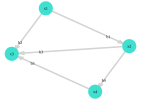

In [60]:
# a simple directed graph on GS p16
g = SimpleDiGraph(4)
add_edge!(g, 1, 2)
add_edge!(g, 1, 3)
add_edge!(g, 2, 3)
add_edge!(g, 2, 4)
add_edge!(g, 4, 3)
gplot(g, nodelabel=["x1", "x2", "x3", "x4"], edgelabel=["b1", "b2", "b3", "b4", "b5"])

The adjacency matrix $\mathbf{A}$ has entries
\begin{eqnarray*}
    a_{ij} = \begin{cases}
    1 & \text{if node $i$ links to node $j$} \\
    0 & \text{otherwise}
    \end{cases}.
\end{eqnarray*}
Note this definition differs from the BV book (p112).

In [61]:
# adjacency matrix A
A = convert(Matrix{Int64}, adjacency_matrix(g))

4×4 Matrix{Int64}:
 0  1  1  0
 0  0  1  1
 0  0  0  0
 0  0  1  0

Give a graph interpretation of $\mathbf{A}^2 = \mathbf{A} \mathbf{A}$, $\mathbf{A}^3 = \mathbf{A} \mathbf{A} \mathbf{A}$, ...

In [62]:
A * A

4×4 Matrix{Int64}:
 0  0  1  1
 0  0  1  0
 0  0  0  0
 0  0  0  0

In [63]:
A * A * A

4×4 Matrix{Int64}:
 0  0  1  0
 0  0  0  0
 0  0  0  0
 0  0  0  0

**Answer**: $(\mathbf{A}^k)_{ij}$ counts the number of paths from node $i$ to node $j$ in exactly $k$ steps.

### Properties of matrix multiplications

- Associative: 
$$
(\mathbf{A} \mathbf{B}) \mathbf{C} = \mathbf{A} (\mathbf{B} \mathbf{C}) = \mathbf{A} \mathbf{B} \mathbf{C}.
$$

- Associative with scalar-matrix multiplication: 
$$
(\alpha \mathbf{B}) \mathbf{C} = \alpha \mathbf{B} \mathbf{C} = \mathbf{B} (\alpha \mathbf{C}).
$$

- Distributive with sum: 
$$
(\mathbf{A} + \mathbf{B}) \mathbf{C} = \mathbf{A} \mathbf{C} + \mathbf{B} \mathbf{C}, \quad \mathbf{A} (\mathbf{B} + \mathbf{C}) = \mathbf{A} \mathbf{B} + \mathbf{A} \mathbf{C}.
$$

- Transpose of product:
$$
(\mathbf{A} \mathbf{B})' = \mathbf{B}' \mathbf{A}'.
$$

- **Not** commutative: In general,
$$
\mathbf{A} \mathbf{B} \ne \mathbf{B} \mathbf{A}.
$$
There are exceptions, e.g., $\mathbf{A} \mathbf{I} = \mathbf{I} \mathbf{A}$ for square $\mathbf{A}$.

In [64]:
A = randn(3, 2)
B = randn(2, 4)
A * B

3×4 Matrix{Float64}:
  0.136209   -1.49924   0.130161  1.04618
 -0.120989    4.11512   5.33368   1.47959
  0.0795319  -1.44861  -1.04623   0.114777

In [65]:
# dimensions are even incompatible!
B * A

LoadError: DimensionMismatch: A has dimensions (2,4) but B has dimensions (3,2)

- For two vectors $\mathbf{a} \in \mathbb{R}^m$ and $\mathbf{b} \in \mathbb{R}^n$, the matrix
$$
\mathbf{a} \mathbf{b}' = \begin{pmatrix} a_1 \\ \vdots \\ a_m \end{pmatrix} \begin{pmatrix} b_1 \, \cdots \, b_n \end{pmatrix} = \begin{pmatrix}
a_1 b_1 & \cdots & a_1 b_n \\
\vdots &  & \vdots \\
a_m b_1 & \cdots & a_m b_n
\end{pmatrix}
$$
is called the **outer product** of $\mathbf{a}$ and $\mathbf{b}$. Apparently $\mathbf{a} \mathbf{b}' \ne \mathbf{b}' \mathbf{a}$ unless both are scalars.

- View of matrix-matrix product $\mathbf{C} = \mathbf{A} \mathbf{B}$ as sum of outer products:
$$
\mathbf{C} = \begin{pmatrix}
| & & | \\
\mathbf{a}_1 & \cdots & \mathbf{a}_n \\
| & & |
\end{pmatrix} \begin{pmatrix} - & \mathbf{b}_1' & - \\ & \vdots & \\ - & \mathbf{b}_n' & -
\end{pmatrix} = \mathbf{a}_1 \mathbf{b}_1' + \cdots + \mathbf{a}_n \mathbf{b}_n'.
$$

In [66]:
m, n, p = 3, 2, 4
A = randn(m, n)
B = randn(n, p)
C = A * B
@show C ≈ A[:, 1] * B[1, :]' + A[:, 2] * B[2, :]'

C ≈ A[:, 1] * (B[1, :])' + A[:, 2] * (B[2, :])' = true


true

### Gram matrix

- Let $\mathbf{A} \in \mathbb{R}^{m \times n}$ with columns $\mathbf{a}_1, \ldots, \mathbf{a}_n$. The matrix product
$$
\mathbf{G} = \mathbf{A}' \mathbf{A} = \begin{pmatrix} - & \mathbf{a}_1' & - \\ & \vdots & \\ - & \mathbf{a}_n' & - \end{pmatrix} \begin{pmatrix} | & & | \\ \mathbf{a}_1 & \cdots & \mathbf{a}_n \\ | & & | \end{pmatrix}
= \begin{pmatrix} \mathbf{a}_1' \mathbf{a}_1 & \cdots & \mathbf{a}_1' \mathbf{a}_n \\
\vdots & \ddots & \vdots \\
\mathbf{a}_n' \mathbf{a}_1 & \cdots & \mathbf{a}_n' \mathbf{a}_n
\end{pmatrix} \in \mathbb{R}^{n \times n}
$$
is called the **Gram matrix**.

- Gram matrix is symmetric: $\mathbf{G}' = (\mathbf{A}' \mathbf{A})' = \mathbf{A}' (\mathbf{A}')' = \mathbf{A}' \mathbf{A} = \mathbf{G}$.

- We also call $\mathbf{A} \mathbf{A}'$ a Gram matrix.

In [67]:
A = randn(5, 3)

5×3 Matrix{Float64}:
  0.102098   0.391276   0.152292
 -0.629798   0.299738   0.440126
 -1.69713    0.443487   0.750681
 -0.831641  -0.785098  -1.5602
 -1.17616   -1.0839    -0.139942

In [68]:
# 3x3
A' * A

3×3 Matrix{Float64}:
  5.3623     1.02628  -0.0735208
  1.02628    2.23083   1.90102
 -0.0735208  1.90102   3.23424

In [69]:
# 5x5
A * A'

5×5 Matrix{Float64}:
  0.186713   0.120007   0.114575  -0.629704  -0.565498
  0.120007   0.680199   1.53217   -0.398244   0.354265
  0.114575   1.53217    3.64045   -0.107994   1.41035
 -0.629704  -0.398244  -0.107994   3.74224    2.04745
 -0.565498   0.354265   1.41035    2.04745    2.57777

### Linear independence of columns

- A set of vectors $\mathbf{a}_1, \ldots, \mathbf{a}_k \in \mathbb{R}^{n}$ are linearly independent if, for the matrix $\mathbf{A} = (\mathbf{a}_1 \, \ldots \, \mathbf{a}_k) \in \mathbb{R}^{n \times k}$,
$$
\mathbf{A} \mathbf{b} = b_1 \mathbf{a}_1 + \cdots + b_k \mathbf{a}_k = \mathbf{0}_n
$$
implies that $\mathbf{b} = \mathbf{0}_k$. In this case, we also say $\mathbf{A}$ has linearly independent columns.

### Block matrix-matrix multiplication

- Matrix-matrix multiplication in block form:
$$
\begin{pmatrix} \mathbf{A} & \mathbf{B} \\ \mathbf{C} & \mathbf{D} \end{pmatrix} \begin{pmatrix} \mathbf{W} & \mathbf{Y} \\ \mathbf{X} & \mathbf{Z} \end{pmatrix} = \begin{pmatrix} \mathbf{A} \mathbf{W} + \mathbf{B} \mathbf{X} & \mathbf{A} \mathbf{Y} + \mathbf{B} \mathbf{Z} \\ \mathbf{C} \mathbf{W} + \mathbf{D} \mathbf{X} & \mathbf{C} \mathbf{Y} + \mathbf{D} \mathbf{Z} \end{pmatrix}.
$$
Submatrices need to have compatible dimensions.

## Linear functions and operators

- The matrix-vector product $\mathbf{y} = \mathbf{A} \mathbf{x}$ can be viewed as a function acting on input $\mathbf{x} \in \mathbb{R}^n$ and outputing $\mathbf{y} \in \mathbb{R}^m$. In this sense, we also say any matrix $\mathbf{A}$ is a linear operator.

- A function $f: \mathbb{R}^n \mapsto \mathbb{R}^m$ is **linear** if 
$$
f(\alpha \mathbf{x} + \beta \mathbf{y}) = \alpha f(\mathbf{x}) + \beta f(\mathbf{y}).
$$
for all scalars $\alpha, \beta$ and vectors $\mathbf{x}, \mathbf{y} \in \mathbb{R}^n$.

- Definition of linear function implies that the superposition property holds for any linear combination
$$
f(\alpha_1 \mathbf{x}_1 + \cdots + \alpha_p \mathbf{x}_p) = \alpha_1 f(\mathbf{x}_1) + \cdots + \alpha_p f(\mathbf{x}_p).
$$

- Any linear function is a matrix-vector product and vice versa.

    1. For a fixed matrix $\mathbf{A} \in \mathbb{R}^{m \times n}$, the function $f: \mathbb{R}^n \mapsto \mathbb{R}^m$ defined by
    $$
    f(\mathbf{x}) = \mathbf{A} \mathbf{x}
    $$
    is linear, because $f(\alpha \mathbf{x} + \beta \mathbf{y}) = \mathbf{A} (\alpha \mathbf{x} + \beta \mathbf{y}) = \alpha \mathbf{A} \mathbf{x} + \beta \mathbf{A} \mathbf{y} = \alpha f(\mathbf{x}) + \beta f(\mathbf{y})$.

    2. Any linear function is a matrix-vector product because
    \begin{eqnarray*}
    f(\mathbf{x}) &=& f(x_1 \mathbf{e}_1 + \cdots + x_n \mathbf{e}_n) \\
    &=& x_1 f(\mathbf{e}_1) + \cdots + x_n f(\mathbf{e}_n) \\
    &=& \begin{pmatrix}
    f(\mathbf{e}_1) \, \cdots \, f(\mathbf{e}_n)
    \end{pmatrix} \mathbf{x}.
    \end{eqnarray*}
    Hence $f(\mathbf{x}) = \mathbf{A} \mathbf{x}$ with $\mathbf{A} = \begin{pmatrix} f(\mathbf{e}_1) \, \cdots \, f(\mathbf{e}_n) \end{pmatrix}$.

### Permutation

- **Reverser matrix**:
$$
A = \begin{pmatrix}
0 & \cdots & 1 \\
\vdots & .^{.^{.}} & \vdots \\
1 & \cdots & 0
\end{pmatrix}. 
$$
For any vector $\mathbf{x} \in \mathbb{R}^n$,
$$
\mathbf{A} \begin{pmatrix} x_1 \\ x_2 \\ \vdots \\ x_{n-1} \\ x_n \end{pmatrix} = \begin{pmatrix} x_n \\ x_{n-1} \\ \vdots \\ x_2 \\ x_1 \end{pmatrix}.
$$

In [70]:
# a reverser matrix
n = 5
A = [i + j == n + 1 ? 1 : 0 for i in 1:n, j in 1:n]

5×5 Matrix{Int64}:
 0  0  0  0  1
 0  0  0  1  0
 0  0  1  0  0
 0  1  0  0  0
 1  0  0  0  0

In [71]:
x = Vector(1:n)

5-element Vector{Int64}:
 1
 2
 3
 4
 5

In [72]:
A * x

5-element Vector{Int64}:
 5
 4
 3
 2
 1

- **Circular shift matrix**
$$
\mathbf{A} = \begin{pmatrix}
0 & 0 & \cdots & 0 & 1 \\
1 & 0 & \cdots & 0 & 0 \\
0 & 1 & \cdots & 0 & 0 \\
\vdots & \vdots & \ddots & \vdots & \vdots \\
0 & 0 & \cdots & 1 & 0
\end{pmatrix}.
$$
For any vector $\mathbf{x} \in \mathbb{R}^n$,
$$
\quad \mathbf{A} \begin{pmatrix} x_1 \\ x_2 \\ \vdots \\ x_{n-1} \\ x_n \end{pmatrix} = \begin{pmatrix} x_n \\ x_1 \\ x_2 \\ \vdots \\ x_{n-1} \end{pmatrix}.
$$

In [73]:
n = 5
A = [mod(i - j, n) == 1 ? 1 : 0 for i in 1:n, j in 1:n]

5×5 Matrix{Int64}:
 0  0  0  0  1
 1  0  0  0  0
 0  1  0  0  0
 0  0  1  0  0
 0  0  0  1  0

In [74]:
x = Vector(1:n)

5-element Vector{Int64}:
 1
 2
 3
 4
 5

In [75]:
A * x

5-element Vector{Int64}:
 5
 1
 2
 3
 4

In [76]:
A * (A * x)

5-element Vector{Int64}:
 4
 5
 1
 2
 3

- The reverser and circular shift matrices are examples of permutation matrix. 

    A **permutation matrix** is a square 0-1 matrix with one element 1 in each row and one element 1 in each column. 

    Equivalently, a permutation matrix is the identity matrix with columns reordered. 
    
    Equivalently, a permutation matrix is the identity matrix with rows reordered. 
    
    $\mathbf{A} \mathbf{x}$ is a permutation of elements in $\mathbf{x}$.

In [77]:
σ = randperm(n)

5-element Vector{Int64}:
 5
 2
 4
 3
 1

In [78]:
# permute the rows of identity matrix
P = I(n)[σ, :]

5×5 Matrix{Bool}:
 0  0  0  0  1
 0  1  0  0  0
 0  0  0  1  0
 0  0  1  0  0
 1  0  0  0  0

In [79]:
x = Vector(1:n)

5-element Vector{Int64}:
 1
 2
 3
 4
 5

In [80]:
# operator
P * x

5-element Vector{Int64}:
 5
 2
 4
 3
 1

In [81]:
x[σ]

5-element Vector{Int64}:
 5
 2
 4
 3
 1

### Rotation

- A **rotation matrix** in the plane $\mathbb{R}^2$:
$$
\mathbf{A} = \begin{pmatrix}
\cos \theta & - \sin \theta \\
\sin \theta & \cos \theta
\end{pmatrix}.
$$
$\mathbf{A} \mathbf{x}$ is $\mathbf{x}$ rotated counterclockwise over an angle $\theta$.

In [82]:
θ = π/4
A = [cos(θ) -sin(θ); sin(θ) cos(θ)]

2×2 Matrix{Float64}:
 0.707107  -0.707107
 0.707107   0.707107

In [83]:
# rotate counterclockwise 45 degree
x1 = [2, 1]
x2 = A * x1

2-element Vector{Float64}:
 0.7071067811865477
 2.1213203435596424

In [84]:
# rotate counterclockwise 90 degree
x3 = A * x2

2-element Vector{Float64}:
 -0.9999999999999997
  2.0

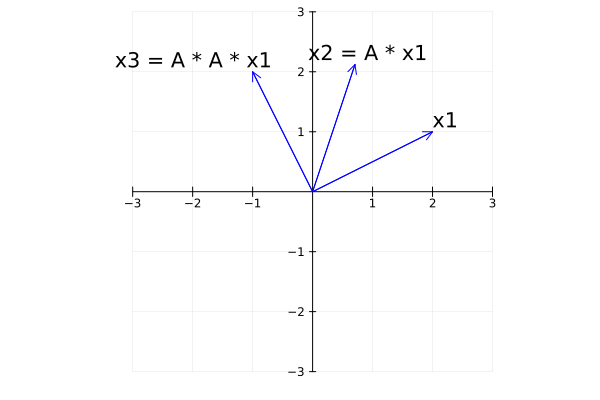

In [85]:
#| code-fold: true

x_vals = [0 0 0; x1[1] x2[1] x3[1]]
y_vals = [0 0 0; x1[2] x2[2] x3[2]]

plot(x_vals, y_vals, arrow = true, color = :blue,
    legend = :none, xlims = (-3, 3), ylims = (-3, 3),
    annotations = [((x1 .+ 0.2)..., "x1"),
                ((x2 .+ 0.2)..., "x2 = A * x1"),
                ((x3 .+ [-1, 0.2])..., "x3 = A * A * x1")],
    xticks = -3:1:3, yticks = -3:1:3,
    framestyle = :origin,
    aspect_ratio = :equal)

- **Exercise**: Given two vectors $\mathbf{x}, \mathbf{y} \in \mathbb{R}^2$ of same length, how do we find a rotation matrix such that $\mathbf{A} \mathbf{x} = \mathbf{y}$?

In [86]:
x, y = randn(2), randn(2)
x = x / norm(x)
y = y / norm(y)
cosθ = x'y / (norm(x) * norm(y))

0.15627788440474166

In [87]:
sinθ = sqrt(1 - cosθ^2)
A = [cosθ -sinθ; sinθ cosθ]

2×2 Matrix{Float64}:
 0.156278  -0.987713
 0.987713   0.156278

In [88]:
# note we have either Ax = y or Ay = x
if A * y ≈ x
    A = [cosθ sinθ; -sinθ cosθ]
end

In [89]:
A * x ≈ y

true

### Projection and reflection

- **Projection** of $\mathbf{x} \in \mathbb{R}^n$ on the line through $\mathbf{0}_n$ and $\mathbf{a}$:
$$
\mathbf{y} = \frac{\mathbf{a}'\mathbf{x}}{\|\mathbf{a}\|^2} \mathbf{a} = \frac{\mathbf{a}\mathbf{a}'}{\|\mathbf{a}\|^2} \mathbf{x} = \mathbf{A} \mathbf{x},
$$
where
$$
\mathbf{A} = \frac{1}{\|\mathbf{a}\|^2} \mathbf{a} \mathbf{a}'.
$$

- **Reflection** of $\mathbf{x} \in \mathbb{R}^n$ with respect to the line through $\mathbf{0}_n$ and $\mathbf{a}$:
$$
\mathbf{z} = \mathbf{x} + 2(\mathbf{y} - \mathbf{x}) = 2 \mathbf{y} - \mathbf{x} = \left( \frac{2}{\|\mathbf{a}\|^2} \mathbf{a} \mathbf{a}' - \mathbf{I} \right) \mathbf{x} = \mathbf{B} \mathbf{x},
$$
with
$$
\mathbf{B} = 2 \mathbf{A} - \mathbf{I} = \frac{2}{\|\mathbf{a}\|^2} \mathbf{a} \mathbf{a}' - \mathbf{I}.
$$

In [90]:
a = [3, 2]
A = a * a' / norm(a)^2
x = [1, 2]
y = A * x
B = 2A - I
z = B * x;

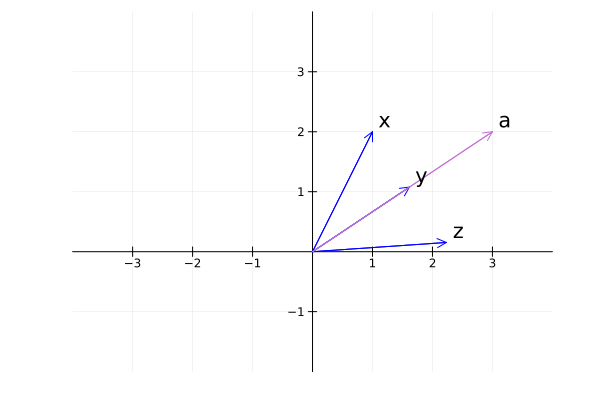

In [91]:
x_vals = [0 0 0; x[1] y[1] z[1]]
y_vals = [0 0 0; x[2] y[2] z[2]]

plt = plot(x_vals, y_vals, arrow = true, color = :blue,
    legend = :none, xlims = (-4, 4), ylims = (-2, 4),
    annotations = [((x .+ 0.2)..., "x"),
                ((y .+ 0.2)..., "y"),
                ((z .+ 0.2)..., "z")],
    xticks = -3:1:3, yticks = -1:1:3,
    framestyle = :origin,
    aspect_ratio = :equal)
plot!(plt, [0, a[1]], [0, a[2]], arrow = true,
    annotations = [((a .+ 0.2)..., "a")])

### Incidence matrix

- For a directed graph with $m$ nodes and $n$ arcs (directed edges), the **node-arc indicence matrix** $\mathbf{B} \in \{-1,0,1\}^{m \times n}$ has entries
\begin{eqnarray*}
    b_{ij} = \begin{cases}
    -1 & \text{if edge $j$ starts at vertex $i$} \\
    1 & \text{if edge $j$ ends at vertex $i$} \\
    0 & \text{otherwise}
    \end{cases}.
\end{eqnarray*}

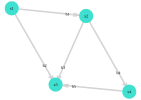

In [92]:
# a simple directed graph on GS p16
g = SimpleDiGraph(4)
add_edge!(g, 1, 2)
add_edge!(g, 1, 3)
add_edge!(g, 2, 3)
add_edge!(g, 2, 4)
add_edge!(g, 4, 3)
gplot(g, nodelabel=["x1", "x2", "x3", "x4"], edgelabel=["b1", "b2", "b3", "b4", "b5"])

In [93]:
# incidence matrix B
B = convert(Matrix{Int64}, incidence_matrix(g))

4×5 Matrix{Int64}:
 -1  -1   0   0   0
  1   0  -1  -1   0
  0   1   1   0   1
  0   0   0   1  -1

- **Kirchhoff's current law**: Let $\mathbf{B} \in \mathbb{R}^{m \times n}$ be an incidence matrix and $\mathbf{x}=(x_1 \, \ldots \, x_n)'$ with $x_j$ the current through arc $j$,
$$
(\mathbf{B} \mathbf{x})_i = \sum_{\text{arc $j$ enters node $i$}} x_j - \sum_{\text{arc $j$ leaves node $i$}} x_j = \text{net current arriving at node $i$}.
$$

In [94]:
# symbolic calculation
@variables x1 x2 x3 x4 x5
B * [x1, x2, x3, x4, x5]

4-element Vector{Num}:
     -x1 - x2
 x1 - x3 - x4
 x2 + x3 + x5
      x4 - x5

- **Kirchhoff's voltage law**: Let $\mathbf{B} \in \mathbb{R}^{m \times n}$ be an incidence matrix and $\mathbf{y} = (y_1, \ldots, y_m)'$ with $y_i$ the potential at node $i$,
$$
(\mathbf{B}' \mathbf{y})_j = y_k - y_l \text{ if edge $j$ goes from node $l$ to node $k$ = negative of the voltage across arc $j$}.
$$

In [95]:
@variables y1 y2 y3 y4
B' * [y1, y2, y3, y4]

5-element Vector{Num}:
 -y1 + y2
 -y1 + y3
 -y2 + y3
 -y2 + y4
  y3 - y4

### Convolution and filtering

- Convolution plays important roles in signal processing, image processing, and (convolutional) neural network.

- The **convolution** of $\mathbf{a} \in \mathbb{R}^n$ and $\mathbf{b} \in \mathbb{R}^m$ is a vector $\mathbf{c} \in \mathbb{R}^{n+m-1}$ with entries
$$
c_k = \sum_{i+j=k+1} a_i b_j.
$$
Notation: $\mathbf{c} = \mathbf{a} * \mathbf{b}$. 

- Example: $n=4$, $m=3$,
$$
\mathbf{a} = \begin{pmatrix} a_1 \\ a_1 \\ a_3 \\ a_4 \end{pmatrix}, \quad \mathbf{b} = \begin{pmatrix} b_1 \\ b_2 \\ b_3 \end{pmatrix}.
$$
Then $\mathbf{c} = \mathbf{a} * \mathbf{b} \in \mathbb{R}^6$ has entries
\begin{eqnarray*}
c_1 &=& a_1 b_1 \\
c_2 &=& a_1 b_2 + a_2 b_1 \\
c_3 &=& a_1 b_3 + a_2 b_2 + a_3 b_1 \\
c_4 &=& a_2 b_3 + a_3 b_2 + a_4 b_1 \\
c_5 &=& a_3 b_3 + a_4 b_2 \\
c_6 &=& a_4 b_3
\end{eqnarray*}

- Polynomial interpretation: Let $\mathbf{a}$ and $\mathbf{b}$ be the coefficients in polynomials
\begin{eqnarray*}
p(x) &=& a_1 + a_2 x + \cdots + a_n x^{n-1} \\
q(x) &=& b_1 + b_2 x + \cdots + b_m x^{m-1},
\end{eqnarray*}
then $\mathbf{c} = \mathbf{a} * \mathbf{b}$ gives the coefficients of the product polynomial
$$
p(x) q(x) = c_1 + c_2 x + \cdots + c_{n+m-1} x^{m+n-2}.
$$

In [96]:
n, m = 4, 3
@variables a[1:n] b[1:m]

2-element Vector{Symbolics.Arr{Num, 1}}:
 a[1:4]
 b[1:3]

In [97]:
p = Polynomial(a)

Polynomial(a[1] + a[2]*x + a[3]*x^2 + a[4]*x^3)

In [98]:
q = Polynomial(b)

Polynomial(b[1] + b[2]*x + b[3]*x^2)

In [99]:
p * q

Polynomial(a[1]*b[1] + a[1]*b[2] + a[2]*b[1]*x + a[1]*b[3] + a[2]*b[2] + a[3]*b[1]*x^2 + a[2]*b[3] + a[3]*b[2] + a[4]*b[1]*x^3 + a[3]*b[3] + a[4]*b[2]*x^4 + a[4]*b[3]*x^5)

In [100]:
coeffs(p * q)

6-element Vector{Num}:
                         a[1]*b[1]
             a[1]*b[2] + a[2]*b[1]
 a[1]*b[3] + a[2]*b[2] + a[3]*b[1]
 a[2]*b[3] + a[3]*b[2] + a[4]*b[1]
             a[3]*b[3] + a[4]*b[2]
                         a[4]*b[3]

In [101]:
a = [1, 0, -1, 2]
b = [2, 1, -1]
c = DSP.conv(a, b)

6-element Vector{Int64}:
  2
  1
 -3
  3
  3
 -2

- Probabilistic interpretation. In probability and statistics, convolution often appears when computing the distribution of the sum of two independent random variables. Let $X$ be a discrete random variable taking value $i \in \{0,1,\ldots,n-1\}$ with probability $a_{i+1}$ and $Y$ be another discrete random variable taking values $j \in \{0,1,\ldots,m-1\}$ with probability $b_{j+1}$. Assume $X$ is independent of $Y$, then the distribution of $Z = X+Y$ is 
$$
c_k = \mathbb{P}(Z = k - 1) = \sum_{i+j=k-1} \mathbb{P}(X = i) \mathbb{P}(Y = j) = \sum_{i+j=k-1} a_{i+1} b_{j+1} = \sum_{i'+j'=k+1} a_{i'} b_{j'}
$$
for $k = 1,\ldots,n+m-1$. In the probability setting, the polynomial is called the probability generating function of a discrete random variable.

In [102]:
n, m, p = 10, 3, 0.5
# pmf of X ∼ Bin(n-1, p)
a = [Distributions.pdf(Binomial(n-1, p), j) for j in 0:n-1]

10-element Vector{Float64}:
 0.001953125
 0.017578124999999997
 0.07031250000000012
 0.16406250000000028
 0.24609375000000003
 0.24609375000000003
 0.16406250000000028
 0.07031250000000012
 0.017578124999999997
 0.001953125

In [103]:
# pmf of Y ∼ Unif(0, m-1)
b = [Distributions.pdf(DiscreteUniform(0, m - 1), j) for j in 0:m-1]

3-element Vector{Float64}:
 0.3333333333333333
 0.3333333333333333
 0.3333333333333333

In [104]:
# compute pmf of Z = X + Y by convolution: c = a * b
c = DSP.conv(a, b)

12-element Vector{Float64}:
 0.0006510416666666713
 0.006510416666666657
 0.029947916666666713
 0.08398437500000012
 0.16015625000000017
 0.2187500000000001
 0.2187500000000001
 0.16015625000000017
 0.08398437500000014
 0.0299479166666667
 0.006510416666666671
 0.0006510416666666713

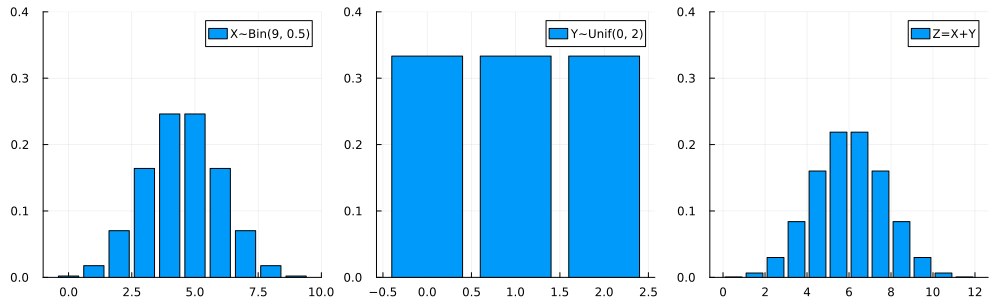

In [105]:
plta = bar(0:(n - 1), a, label="X∼Bin(9, 0.5)")
pltb = bar(0:(m - 1), b, label="Y∼Unif(0, 2)")
pltc = bar(0:(n + m - 1), c, label="Z=X+Y")

plot(plta, pltb, pltc, layout=(1,3), size=(1000, 300), ylim=[0, 0.4])

- Propoerties of convolution

    - symmetric: $\mathbf{a} * \mathbf{b} = \mathbf{b} * \mathbf{a}$. 
    - associative: $(\mathbf{a} * \mathbf{b}) * \mathbf{c} = \mathbf{a} * \mathbf{b} * \mathbf{c} = \mathbf{a} * (\mathbf{b} * \mathbf{c})$. 
    - If $\mathbf{a} * \mathbf{b} = \mathbf{0}$, then $\mathbf{a} = \mathbf{0}$ or $\mathbf{b} = \mathbf{0}$.
    
    These properties follow either from the polynomial interpretation or probabilistic interpretation.

- $\mathbf{c} = \mathbf{a} * \mathbf{b}$ is a linear function of $\mathbf{b}$ if we fix $\mathbf{a}$. 

- $\mathbf{c} = \mathbf{a} * \mathbf{b}$ is a linear function of $\mathbf{a}$ if we fix $\mathbf{b}$.

- For $n=4$ and $m=3$, 

In [106]:
n, m = 4, 3
@variables a[1:n] b[1:m]

2-element Vector{Symbolics.Arr{Num, 1}}:
 a[1:4]
 b[1:3]

In [107]:
# Toeplitz matrix corresponding to the vector a
Ta = diagm(6, 3,
     0 => [a[1], a[1], a[1]],
    -1 => [a[2], a[2], a[2]],
    -2 => [a[3], a[3], a[3]],
    -3 => [a[4], a[4], a[4]]
)

6×3 Matrix{Num}:
 a[1]     0     0
 a[2]  a[1]     0
 a[3]  a[2]  a[1]
 a[4]  a[3]  a[2]
    0  a[4]  a[3]
    0     0  a[4]

In [108]:
c = Ta * b

(Any[a[1] 0 0; a[2] a[1] 0; … ; 0 a[4] a[3]; 0 0 a[4]]*b)[Base.OneTo(6)]

In [109]:
# c = Ta * b
Symbolics.scalarize(c)

LoadError: MethodError: no method matching *(::SymbolicUtils.BasicSymbolic{Any}, ::SymbolicUtils.BasicSymbolic{Real})

[0mClosest candidates are:
[0m  *(::Any, ::Any, [91m::Any[39m, [91m::Any...[39m)
[0m[90m   @[39m [90mBase[39m [90m[4moperators.jl:587[24m[39m
[0m  *([91m::ChainRulesCore.ZeroTangent[39m, ::Any)
[0m[90m   @[39m [32mChainRulesCore[39m [90m~/.julia/packages/ChainRulesCore/6Pucz/src/[39m[90m[4mtangent_arithmetic.jl:104[24m[39m
[0m  *(::Any, [91m::MutableArithmetics.Zero[39m)
[0m[90m   @[39m [33mMutableArithmetics[39m [90m~/.julia/packages/MutableArithmetics/beEHn/src/[39m[90m[4mrewrite.jl:62[24m[39m
[0m  ...


In [110]:
# Toeplitz matrix corresponding to the vector b
Tb = diagm(6, 4,
     0 => [b[1], b[1], b[1], b[1]],
    -1 => [b[2], b[2], b[2], b[2]],
    -2 => [b[3], b[3], b[3], b[3]]
)

6×4 Matrix{Num}:
 b[1]     0     0     0
 b[2]  b[1]     0     0
 b[3]  b[2]  b[1]     0
    0  b[3]  b[2]  b[1]
    0     0  b[3]  b[2]
    0     0     0  b[3]

In [111]:
# c = Tb * a
Symbolics.scalarize(Tb * a)

LoadError: MethodError: no method matching *(::SymbolicUtils.BasicSymbolic{Any}, ::SymbolicUtils.BasicSymbolic{Real})

[0mClosest candidates are:
[0m  *(::Any, ::Any, [91m::Any[39m, [91m::Any...[39m)
[0m[90m   @[39m [90mBase[39m [90m[4moperators.jl:587[24m[39m
[0m  *([91m::ChainRulesCore.ZeroTangent[39m, ::Any)
[0m[90m   @[39m [32mChainRulesCore[39m [90m~/.julia/packages/ChainRulesCore/6Pucz/src/[39m[90m[4mtangent_arithmetic.jl:104[24m[39m
[0m  *(::Any, [91m::MutableArithmetics.Zero[39m)
[0m[90m   @[39m [33mMutableArithmetics[39m [90m~/.julia/packages/MutableArithmetics/beEHn/src/[39m[90m[4mrewrite.jl:62[24m[39m
[0m  ...


- The convolution matrices $\mathbf{T}_a$ and $\mathbf{T}_b$ are examples of **Toeplitz matrices**.

- When one vector is much longer than the other, for example, $m \ll n$, we can consider the longer vector $\mathbf{a} \in \mathbb{R}^n$ as **signal**, and apply the inner product of the **filter** (also called **kernel**) $(b_m, \cdots, b_1) \in \mathbb{R}^m$ along a sliding window of $\mathbf{a}$.

- If we apply filter (or kernel) in original order to the sliding window of the signal, it is called **correlation** instead of **convolution**. For symmetric filter (or kernel), correlation is same as convolution.

- (2D) Filtering is extensively used in image processing.

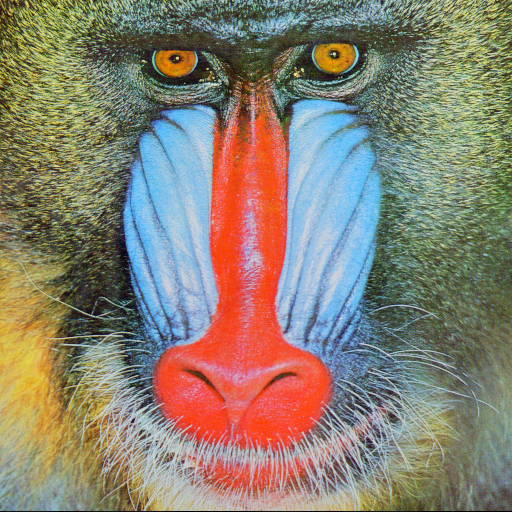

In [112]:
img = testimage("mandrill")

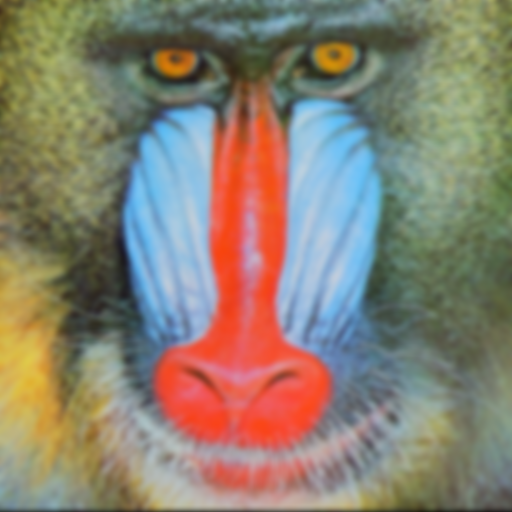

In [113]:
# correlatin with Gaussian kernel
imgg = imfilter(img, Kernel.gaussian(3))

In [114]:
?Kernel.gaussian()

```
gaussian((σ1, σ2, ...), [(l1, l2, ...)]) -> g
gaussian(σ)                  -> g
```

Construct a multidimensional gaussian filter, with standard deviation `σd` along dimension `d`. Optionally provide the kernel length `l`, which must be a tuple of the same length.

If `σ` is supplied as a single number, a symmetric 2d kernel is constructed.

See also: [`KernelFactors.gaussian`](@ref).


In [115]:
# Gaussian kernel with σ = 3
Kernel.gaussian(3)

13×13 OffsetArray(::Matrix{Float64}, -6:6, -6:6) with eltype Float64 with indices -6:6×-6:6:
 0.000343881  0.000633593  0.00104462  …  0.000633593  0.000343881
 0.000633593  0.00116738   0.00192468     0.00116738   0.000633593
 0.00104462   0.00192468   0.00317327     0.00192468   0.00104462
 0.00154117   0.00283956   0.00468165     0.00283956   0.00154117
 0.00203464   0.00374877   0.00618068     0.00374877   0.00203464
 0.00240364   0.00442865   0.00730161  …  0.00442865   0.00240364
 0.00254095   0.00468165   0.00771874     0.00468165   0.00254095
 0.00240364   0.00442865   0.00730161     0.00442865   0.00240364
 0.00203464   0.00374877   0.00618068     0.00374877   0.00203464
 0.00154117   0.00283956   0.00468165     0.00283956   0.00154117
 0.00104462   0.00192468   0.00317327  …  0.00192468   0.00104462
 0.000633593  0.00116738   0.00192468     0.00116738   0.000633593
 0.000343881  0.000633593  0.00104462     0.000633593  0.000343881

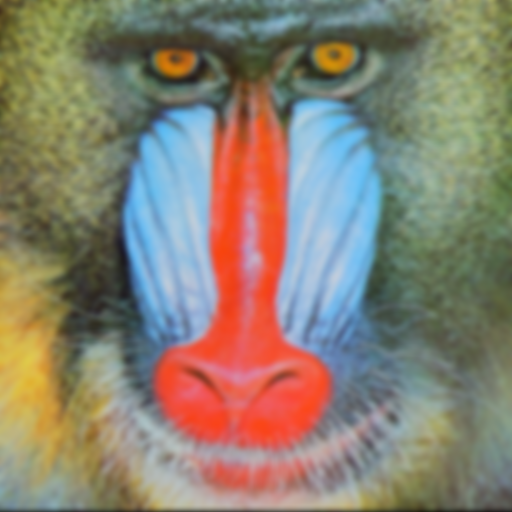

In [116]:
# convolution with Gaussian kernel is same as correlation, since Gaussian kernel is symmetric
imgg = imfilter(img, reflect(Kernel.gaussian(3)))

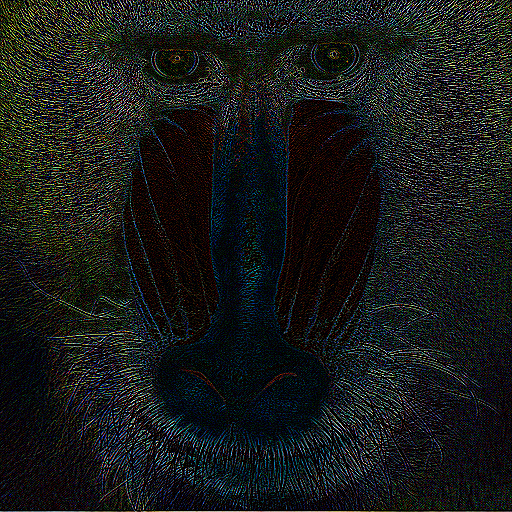

In [117]:
# Correlation with Laplace kernel
imgl = imfilter(img, Kernel.Laplacian())

In [118]:
# Laplacian kernel
Kernel.Laplacian()

ImageFiltering.Kernel.Laplacian{2}((true, true), CartesianIndex{2}[CartesianIndex(1, 0), CartesianIndex(0, 1)])

In [119]:
?Kernel.Laplacian()

```
Laplacian((true,true,false,...))
Laplacian(dims, N)
Laplacian()
```

Laplacian kernel in `N` dimensions, taking derivatives along the directions marked as `true` in the supplied tuple. Alternatively, one can pass `dims`, a listing of the dimensions for differentiation. (However, this variant is not inferrable.)

`Laplacian()` is the 2d laplacian, equivalent to `Laplacian((true,true))`.

The kernel is represented as an opaque type, but you can use `convert(AbstractArray, L)` to convert it into array format.


In [120]:
convert(AbstractArray, Kernel.Laplacian())

3×3 OffsetArray(::Matrix{Int64}, -1:1, -1:1) with eltype Int64 with indices -1:1×-1:1:
 0   1  0
 1  -4  1
 0   1  0

## Affine functions

- A function $f: \mathbb{R}^n \mapsto \mathbb{R}^m$ is **affine** if 
$$
f(\alpha \mathbf{x} + \beta \mathbf{y}) = \alpha f(\mathbf{x}) + \beta f(\mathbf{y}).
$$
for all vectors $\mathbf{x}, \mathbf{y} \in \mathbb{R}^n$ and scalars $\alpha, \beta$ with $\alpha + \beta = 1$.

- Any linear function is affine. Why?

- Definition of affine function implies that
$$
f(\alpha_1 \mathbf{x}_1 + \cdots + \alpha_p \mathbf{x}_p) = \alpha_1 f(\mathbf{x}_1) + \cdots + \alpha_p f(\mathbf{x}_p)
$$
for all vectors $\mathbf{x}_1, \ldots, \mathbf{x}_p$ and scalars $\alpha_1, \ldots, \alpha_p$ such that $\alpha_1 + \cdots + \alpha_p = 1$.

- Any affine function $f: \mathbb{R}^n \mapsto \mathbb{R}^m$ is of the form $\mathbf{A} \mathbf{x} + \mathbf{b}$ for some matrix $\mathbf{A} \in \mathbb{R}^{m \times n}$ and vector $\mathbf{b} \in \mathbb{R}^m$ and vice versa. 

    1. For fixed $\mathbf{A} \in \mathbb{R}^{m \times n}$ and $\mathbf{b} \in \mathbb{R}^m$, define function $f: \mathbb{R}^n \mapsto \mathbb{R}^m$ by a matrix-vector product plus a constant:
    $$
    f(\mathbf{x}) = \mathbf{A} \mathbf{x} + \mathbf{b}.
    $$
    Then $f$ is an affine function: if $\alpha + \beta = 1$, then
    $$
    f(\alpha \mathbf{x} + \beta \mathbf{y}) = \mathbf{A}(\alpha \mathbf{x} + \beta \mathbf{y}) + \mathbf{b} = \alpha \mathbf{A} \mathbf{x} + \beta \mathbf{A} \mathbf{y} + \alpha \mathbf{b} + \beta \mathbf{b} = \alpha(\mathbf{A} \mathbf{x} + \mathbf{b}) + \beta (\mathbf{A} \mathbf{y} + \mathbf{b}) = \alpha f(\mathbf{x}) + \beta f(\mathbf{y}).
    $$

    2. Any affine function can be written as $f(\mathbf{x}) = \mathbf{A} \mathbf{x} + \mathbf{b}$ with
    $$
    \mathbf{A} = \begin{pmatrix}
    f(\mathbf{e}_1) - f(\mathbf{0}) \quad f(\mathbf{e}_2) - f(\mathbf{0}) \quad \ldots \quad f(\mathbf{e}_n) - f(\mathbf{0})
    \end{pmatrix}
    $$
    and $\mathbf{b} = f(\mathbf{0})$. Hint: Write $\mathbf{x} = x_1 \mathbf{e}_1 + \cdots + x_n \mathbf{e}_n + (1 - x_1 - \cdots - x_n) \mathbf{0}$. 

## Affine approximation of a function (important)

- The **first-order Taylor approximation of a differentiable function $f: \mathbb{R} \mapsto \mathbb{R}$ at a point $z \in \mathbb{R}$** is
$$
\widehat f(x) = f(z) + f'(z) (x - z),
$$
where $f'(z)$ is the **derivative** of $f$ at $z$.

- Example: $f(x) = e^{2x} - x$. The derivative is $f'(x) = 2e^{2x} - 1$. Then the first-order Taylor approximation of $f$ at point $z$ is
$$
f(x) \approx e^{2z} - z + (2e^{2z} - 1) (x - z).
$$

ForwardDiff.derivative(f1, z) = 1.0


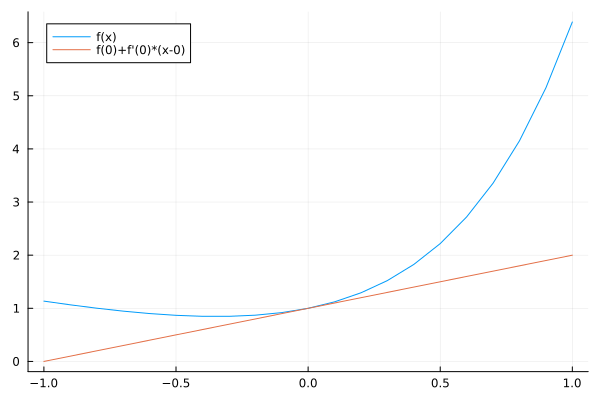

In [121]:
x = Vector(-1:0.1:1)
f1(x) = exp(2x) - x
# draw the function
plt = plot(x, f1.(x), label = "f(x)")
# draw the affine approximation at z=0
z = 0.0
@show ForwardDiff.derivative(f1, z) # let computer calculate derivative!
f̂1 = f1(z) .+ ForwardDiff.derivative(f1, z) .* (x .- z)
plot!(plt, x, f̂1, label = "f(0)+f'(0)*(x-0)", legend = :topleft)

- The **first-order Taylor approximation of a differentiable function $f: \mathbb{R}^n \mapsto \mathbb{R}$ at a point $\mathbf{z} \in \mathbb{R}^n$** is
$$
\widehat f(\mathbf{x}) = f(\mathbf{z}) + [\nabla f(\mathbf{z})]' (\mathbf{x} - \mathbf{z}),
$$
where 
$$
\nabla f(\mathbf{z}) = \begin{pmatrix}
\frac{\partial f}{\partial x_1}(\mathbf{z}) \\ \vdots \\ \frac{\partial f}{\partial x_n}(\mathbf{z})
\end{pmatrix}
$$
is the **gradient** of $f$ evaluated at point $\mathbf{z}$. 

- An example with $n=2$: The gradient of 
$$
f(\mathbf{x}) = f(x_1, x_2) = e^{2x_1 + x_2} - x_1
$$
is
$$
\nabla f(\mathbf{x}) = \begin{pmatrix}
2 e^{2x_1 + x_2} - 1\\
e^{2x_1 + x_2}
\end{pmatrix}.
$$
The first-order Taylor approximation of $f$ at a point $\mathbf{z}$ is
$$
f(\mathbf{x}) \approx e^{2z_1 + z_2} - z_1 + \begin{pmatrix}
2 e^{2z_1 + z_2} - 1 \,\,
e^{2z_1 + z_2}
\end{pmatrix} \begin{pmatrix} x_1 - z_1 \\ x_2 - z_2 \end{pmatrix}.
$$

ForwardDiff.gradient(f2, z) = [1.0, 1.0]


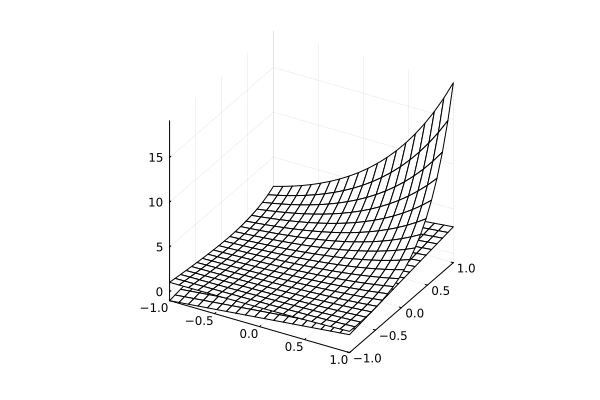

In [122]:
# a non-linear function f
f2(x) = exp(2x[1] + x[2]) - x[1]
# define grid
n = 20
grid = range(-1, 1, length = n)
# draw the first-order approximation at (0,0)
z = [0.0, 0.0]
@show ForwardDiff.gradient(f2, z) # let computer calculate gradient!
f2_approx(x) = f2(z) + ForwardDiff.gradient(f2, z)' * (x - z)
f̂2x = [f2_approx([grid[row], grid[col]]) for row in 1:n, col in 1:n]
plt = wireframe(grid, grid, f̂2x, label="f")
# draw the function 
f2x = [f2([grid[row], grid[col]]) for row in 1:n, col in 1:n]
wireframe!(plt, grid, grid, f2x, label="fhat")

- Affine approximation: The **first-order Taylor approximation of a differentiable function $f: \mathbb{R}^n \mapsto \mathbb{R}^m$ at a point $\mathbf{z} \in \mathbb{R}^n$** is
$$
\widehat f(\mathbf{x}) = f(\mathbf{z}) + [\operatorname{D} f(\mathbf{z})] (\mathbf{x} - \mathbf{z}),
$$
where $\operatorname{D} f(\mathbf{z}) \in \mathbb{R}^{m \times n}$ is the **derivative matrix** or **Jacobian matrix** or **differential** evaluated at $\mathbf{z}$
$$
\operatorname{D} f(\mathbf{z}) = \begin{pmatrix}
\frac{\partial f_1}{\partial x_1} (\mathbf{z}) & \frac{\partial f_1}{\partial x_2} (\mathbf{z}) & \cdots & \frac{\partial f_1}{\partial x_n} (\mathbf{z}) \\
\frac{\partial f_2}{\partial x_1} (\mathbf{z}) & \frac{\partial f_2}{\partial x_2} (\mathbf{z}) & \cdots & \frac{\partial f_2}{\partial x_n} (\mathbf{z}) \\
\vdots & \vdots & & \vdots \\
\frac{\partial f_m}{\partial x_1} (\mathbf{z}) & \frac{\partial f_m}{\partial x_2} (\mathbf{z}) & \cdots & \frac{\partial f_m}{\partial x_n} (\mathbf{z})
\end{pmatrix} = \begin{pmatrix}
\nabla f_1(\mathbf{z})' \\
\nabla f_2(\mathbf{z})' \\
\vdots \\
\nabla f_m(\mathbf{z})'
\end{pmatrix}.
$$

- An example with $n=m=2$:
$$
f(\mathbf{x}) = \begin{pmatrix} f_1(\mathbf{x}) \\ f_2(\mathbf{x}) \end{pmatrix} = \begin{pmatrix}
e^{2x_1 + x_2} - x_1 \\
x_1^2 - x_2
\end{pmatrix}.
$$
Derivative matrix is
$$
\operatorname{D} f(\mathbf{x}) = \begin{pmatrix}
2e^{2x_1 + x_2} - 1 & e^{2x_1 + x_2} \\
2x_1 & -1
\end{pmatrix}
$$
First-order approximation of $f$ around $\mathbf{z} = \mathbf{0}$ is
$$
f(\mathbf{x}) \approx \begin{pmatrix} 1 \\ 0 \end{pmatrix} + \begin{pmatrix}
1 & 1 \\
0 & -1
\end{pmatrix} \begin{pmatrix} x_1 - 0 \\ x_2 - 0 \end{pmatrix}.
$$

In [123]:
# a nonlinear function
f3(x) = [exp(2x[1] + x[2]) - x[1], x[1]^2 - x[2]]
z = [0, 0]
ForwardDiff.jacobian(f3, [0, 0])

2×2 Matrix{Float64}:
 1.0   1.0
 0.0  -1.0

## Computational complexity (important)

- Matrix-vector product: $\mathbf{y} = \mathbf{A} \mathbf{x}$ where $\mathbf{A} \in \mathbb{R}^{m \times n}$ and $\mathbf{x} \in \mathbb{R}^n$. $2mn$ flops.

- Special cases: 
    - $\mathbf{A} \in \mathbb{R}^{n \times n}$ is diagonal, $\mathbf{A} \mathbf{x}$ takes $n$ flops.
    - $\mathbf{A} \in \mathbb{R}^{n \times n}$ is lower triangular, $\mathbf{A} \mathbf{x}$ takes $n^2$ flops.
    - $\mathbf{A} \in \mathbb{R}^{m \times n}$ is sparse, between $\text{nnz}(\mathbf{A})$ and $2\text{nnz}(\mathbf{A})$ flops, much less than $\ll 2mn$.
    
- Matrix-matrix product: $\mathbf{C} = \mathbf{A} \mathbf{B}$ where $\mathbf{A} \in \mathbb{R}^{m \times n}$ and $\mathbf{B} \in \mathbb{R}^{n \times p}$. Naive algorithm $2mnp$ flops. [Strassen's algorithm](https://en.wikipedia.org/wiki/Strassen_algorithm) reduces multiplication of two square matrices to $O(n^{\log_2 7})$ flops. Recent breakthroughs by [AlphaTensor](https://www.nature.com/nature/volumes/610/issues/7930).

<img src="./matrix_games_cover.png" width=300 align="center"/>

In [124]:
Random.seed!(216)
n = 2000
A = Diagonal(randn(n))

2000×2000 Diagonal{Float64, Vector{Float64}}:
 1.27293    ⋅           ⋅         ⋅       …    ⋅       ⋅        ⋅ 
  ⋅       -0.0716618    ⋅         ⋅            ⋅       ⋅        ⋅ 
  ⋅         ⋅         -0.445158   ⋅            ⋅       ⋅        ⋅ 
  ⋅         ⋅           ⋅        0.45854       ⋅       ⋅        ⋅ 
  ⋅         ⋅           ⋅         ⋅            ⋅       ⋅        ⋅ 
  ⋅         ⋅           ⋅         ⋅       …    ⋅       ⋅        ⋅ 
  ⋅         ⋅           ⋅         ⋅            ⋅       ⋅        ⋅ 
  ⋅         ⋅           ⋅         ⋅            ⋅       ⋅        ⋅ 
  ⋅         ⋅           ⋅         ⋅            ⋅       ⋅        ⋅ 
  ⋅         ⋅           ⋅         ⋅            ⋅       ⋅        ⋅ 
  ⋅         ⋅           ⋅         ⋅       …    ⋅       ⋅        ⋅ 
  ⋅         ⋅           ⋅         ⋅            ⋅       ⋅        ⋅ 
  ⋅         ⋅           ⋅         ⋅            ⋅       ⋅        ⋅ 
 ⋮                                        ⋱                    
  ⋅         ⋅      

In [125]:
Ads = convert(Matrix{Float64}, A)

2000×2000 Matrix{Float64}:
 1.27293   0.0         0.0       0.0      …   0.0     0.0      0.0
 0.0      -0.0716618   0.0       0.0          0.0     0.0      0.0
 0.0       0.0        -0.445158  0.0          0.0     0.0      0.0
 0.0       0.0         0.0       0.45854      0.0     0.0      0.0
 0.0       0.0         0.0       0.0          0.0     0.0      0.0
 0.0       0.0         0.0       0.0      …   0.0     0.0      0.0
 0.0       0.0         0.0       0.0          0.0     0.0      0.0
 0.0       0.0         0.0       0.0          0.0     0.0      0.0
 0.0       0.0         0.0       0.0          0.0     0.0      0.0
 0.0       0.0         0.0       0.0          0.0     0.0      0.0
 0.0       0.0         0.0       0.0      …   0.0     0.0      0.0
 0.0       0.0         0.0       0.0          0.0     0.0      0.0
 0.0       0.0         0.0       0.0          0.0     0.0      0.0
 ⋮                                        ⋱                    
 0.0       0.0         0.0       0.0  

In [126]:
x = randn(n)

2000-element Vector{Float64}:
  2.0314043735263034
 -0.3687443438256437
  0.7363463615036785
 -1.600899536724722
 -0.02890051885853412
 -0.18116967265515838
 -0.43957076020377434
  1.9815277384654675
  0.6362513594710829
 -1.1135770842839376
  0.6408861697284554
  0.6863376633172646
  1.8558644138243796
  ⋮
  0.1579203124162782
 -0.3925611695527283
 -0.17747213741279871
  0.11443198578886736
  0.5773804015097419
  0.17723782669769725
  0.7071508705765172
  0.7346079283840453
  0.37606179840817333
  0.6417818426381406
 -0.4706151705970243
  1.0581296411180476

In [127]:
# full matrix times vector
@benchmark $Ads * $x

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  286.750 μs …  13.531 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     383.479 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   403.843 μs ± 211.934 μs  ┊ GC (mean ± σ):  0.00% ± 0.00%

     ▁█      █                                                   
  ▁▁▁██▂▁▁▁▁▇█▇▂▁▂▇▆▂▁▁▁▁▁▃█▅▄▆█▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁ ▂
  287 μs           Histogram: frequency by time          671 μs <

 Memory estimate: 15.88 KiB, allocs estimate: 1.

In [128]:
# dense matrix times vector
@benchmark $A * $x

BenchmarkTools.Trial: 10000 samples with 192 evaluations.
 Range (min … max):  332.031 ns … 381.951 μs  ┊ GC (min … max):  0.00% … 99.66%
 Time  (median):     979.711 ns               ┊ GC (median):     0.00%
 Time  (mean ± σ):     1.482 μs ±   4.455 μs  ┊ GC (mean ± σ):  30.48% ± 16.20%

  ▁▁█▇▆                                                         ▂
  █████▇▆▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▆▆▇███▇ █
  332 ns        Histogram: log(frequency) by time       14.6 μs <

 Memory estimate: 15.88 KiB, allocs estimate: 1.

In [129]:
# benchmark
Random.seed!(216)
n = 2000
A = LowerTriangular(randn(n, n))

2000×2000 LowerTriangular{Float64, Matrix{Float64}}:
  1.27293       ⋅           ⋅         …   ⋅           ⋅          ⋅ 
 -0.0716618    0.284808     ⋅             ⋅           ⋅          ⋅ 
 -0.445158     0.0206859  -0.0462908      ⋅           ⋅          ⋅ 
  0.45854     -0.0480526  -0.164488       ⋅           ⋅          ⋅ 
  0.100877    -1.12914    -0.518114       ⋅           ⋅          ⋅ 
 -1.24595      0.51558    -0.467994   …   ⋅           ⋅          ⋅ 
  0.881297    -0.386634   -0.995445       ⋅           ⋅          ⋅ 
 -1.5708      -0.0754179   1.03246        ⋅           ⋅          ⋅ 
  0.485928     0.444032   -0.58004        ⋅           ⋅          ⋅ 
 -0.949817    -0.459397   -0.554477       ⋅           ⋅          ⋅ 
 -0.00147378  -1.35201     0.883788   …   ⋅           ⋅          ⋅ 
 -0.270751    -1.09727    -0.458044       ⋅           ⋅          ⋅ 
 -0.37621      0.855727    0.951051       ⋅           ⋅          ⋅ 
  ⋮                                   ⋱                        

In [130]:
Ads = convert(Matrix{Float64}, A)

2000×2000 Matrix{Float64}:
  1.27293      0.0         0.0        …  0.0         0.0        0.0
 -0.0716618    0.284808    0.0           0.0         0.0        0.0
 -0.445158     0.0206859  -0.0462908     0.0         0.0        0.0
  0.45854     -0.0480526  -0.164488      0.0         0.0        0.0
  0.100877    -1.12914    -0.518114      0.0         0.0        0.0
 -1.24595      0.51558    -0.467994   …  0.0         0.0        0.0
  0.881297    -0.386634   -0.995445      0.0         0.0        0.0
 -1.5708      -0.0754179   1.03246       0.0         0.0        0.0
  0.485928     0.444032   -0.58004       0.0         0.0        0.0
 -0.949817    -0.459397   -0.554477      0.0         0.0        0.0
 -0.00147378  -1.35201     0.883788   …  0.0         0.0        0.0
 -0.270751    -1.09727    -0.458044      0.0         0.0        0.0
 -0.37621      0.855727    0.951051      0.0         0.0        0.0
  ⋮                                   ⋱                        
  0.510276     1.05403   

In [131]:
x = randn(n)
# full matrix times vector
@benchmark $Ads * $x

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  351.417 μs …  11.506 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     442.250 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   449.396 μs ± 190.471 μs  ┊ GC (mean ± σ):  0.00% ± 0.00%

     ▁              ▄▇▂     ▃█▃                                  
  ▂▅██▅▃▂▂▂▂▂▂▃▄▄▃▃▆███▄▃▂▂▅███▅▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂ ▃
  351 μs           Histogram: frequency by time          628 μs <

 Memory estimate: 15.88 KiB, allocs estimate: 1.

In [132]:
# lower triangular matrix times vector
@benchmark $A * $x

BenchmarkTools.Trial: 10000 samples with 1 evaluation.
 Range (min … max):  50.750 μs … 264.834 μs  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     53.708 μs               ┊ GC (median):    0.00%
 Time  (mean ± σ):   54.007 μs ±   2.922 μs  ┊ GC (mean ± σ):  0.00% ± 0.00%

               ▅▅▆▆▆█▂                                          
  ▂▂▂▂▃▂▃▃▃▄▄▆█████████▆▅▄▃▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂ ▃
  50.8 μs         Histogram: frequency by time         61.3 μs <

 Memory estimate: 15.88 KiB, allocs estimate: 1.

- Matrix-matrix product: $\mathbf{C} = \mathbf{A} \mathbf{B}$, where $\mathbf{A} \in \mathbb{R}^{m \times n}$ and $\mathbf{B} \in \mathbb{R}^{n \times p}$. $2mnp$ flops.

- Exercise: Evaluate $\mathbf{y} = \mathbf{A} \mathbf{B} \mathbf{x}$, where $\mathbf{A}, \mathbf{B} \in \mathbb{R}^{n \times n}$, in two ways
    - $\mathbf{y} = (\mathbf{A} \mathbf{B}) \mathbf{x}$. $2n^3$ flops.
    - $\mathbf{y} = \mathbf{A} (\mathbf{B} \mathbf{x})$. $4n^2$ flops.  
Which method is faster? 

In [133]:
Random.seed!(216)
n = 2000
A = randn(n, n)
B = randn(n, n)
x = randn(n);

In [134]:
@benchmark ($A * $B) * $x

BenchmarkTools.Trial: 94 samples with 1 evaluation.
 Range (min … max):  51.014 ms … 131.056 ms  ┊ GC (min … max): 0.00% … 58.13%
 Time  (median):     52.116 ms               ┊ GC (median):    0.00%
 Time  (mean ± σ):   53.623 ms ±   8.227 ms  ┊ GC (mean ± σ):  2.02% ±  6.14%

       ▂█ ▁                                                     
  ▃▁▁▃▆████▄▁▁▁▁▁▁▁▃▃▁▁▄▃▄▄▁▃▁▃▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▃ ▁
  51 ms           Histogram: frequency by time         60.3 ms <

 Memory estimate: 30.53 MiB, allocs estimate: 3.

In [135]:
@benchmark $A * ($B * $x)

BenchmarkTools.Trial: 4190 samples with 1 evaluation.
 Range (min … max):  1.151 ms …  2.136 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     1.184 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   1.190 ms ± 38.614 μs  ┊ GC (mean ± σ):  0.00% ± 0.00%

      ▂▅███▇▆▄▃▁                                              
  ▂▂▃▅███████████▆▅▄▄▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▁▁▂▂▂▂▁▁▁▁▂▁▂▂▂▂▂▂▁▂ ▃
  1.15 ms        Histogram: frequency by time        1.35 ms <

 Memory estimate: 31.75 KiB, allocs estimate: 2.

- Exercise: Evaluate $\mathbf{y} = (\mathbf{I} + \mathbf{u} \mathbf{v}') \mathbf{x}$, where $\mathbf{u}, \mathbf{v}, \mathbf{x} \in \mathbb{R}^n$, in two ways.
    - Evaluate $\mathbf{A} = \mathbf{I} + \mathbf{u} \mathbf{v}'$, then $\mathbf{y} = \mathbf{A} \mathbf{x}$. $3n^2$ flops.  
    - Evaluate $\mathbf{y} = \mathbf{x} + (\mathbf{v}'\mathbf{x}) \mathbf{u}$. $4n$ flops.  
    Which method is faster?

In [136]:
Random.seed!(216)
n = 2000
u = randn(n)
v = randn(n)
x = randn(n);

In [137]:
# method 1
@benchmark (I + $u * $v') * $x

BenchmarkTools.Trial: 1042 samples with 1 evaluation.
 Range (min … max):  1.900 ms … 82.898 ms  ┊ GC (min … max):  0.00% … 92.65%
 Time  (median):     4.718 ms              ┊ GC (median):     0.00%
 Time  (mean ± σ):   4.799 ms ±  2.904 ms  ┊ GC (mean ± σ):  11.72% ± 14.11%

         ▃█▇▅▄   ▂▇▇█▇▆▆▄▄▃▁                                 ▁
  ▅▁▁▁▁▁▁█████▇█▁███████████▅▇▇▇▅▁▄▇▅▄▅▆▄▅▁▇▇▄▁▆▆▄▄▅▄▁▄▄▁▄▄▅ █
  1.9 ms       Histogram: log(frequency) by time       11 ms <

 Memory estimate: 61.05 MiB, allocs estimate: 5.

In [138]:
# method 2
@benchmark $x + dot($v, $x) * $u

BenchmarkTools.Trial: 10000 samples with 10 evaluations.
 Range (min … max):  1.575 μs …  10.607 ms  ┊ GC (min … max):  0.00% … 99.96%
 Time  (median):     3.321 μs               ┊ GC (median):     0.00%
 Time  (mean ± σ):   5.103 μs ± 107.917 μs  ┊ GC (mean ± σ):  34.38% ±  3.58%

                               ▅█▂▂▃                           
  ▂▁▁▂▂▂▃▄▃▃▂▂▂▂▂▂▂▂▃▅██▇▆▅▄▅▅▅█████▇▇▆▇▆▅▄▄▄▄▄▃▄▃▃▃▃▃▂▂▂▂▂▂▂ ▃
  1.58 μs         Histogram: frequency by time        4.88 μs <

 Memory estimate: 31.75 KiB, allocs estimate: 2.

## Matrix with orthonormal columns, orthogonal matrix, QR factorization

- A set of vectors $\mathbf{a}_1, \ldots, \mathbf{a}_k \in \mathbb{R}^{n}$ are orthonormal if the matrix $\mathbf{A} = (\mathbf{a}_1 \, \ldots \, \mathbf{a}_k) \in \mathbb{R}^{n \times k}$ satisfies
$$
\mathbf{A}' \mathbf{A} = \mathbf{I}_k.
$$
In this case, we say $\mathbf{A}$ has orthonormal columns, or $\mathbf{A}$ lives in the Stiefel manifold.

- When $k = n$, a square matrix $\mathbf{A}$ with $\mathbf{A}'\mathbf{A} = \mathbf{I}_n$ is called an **orthogonal matrix**. Example: $\mathbf{I}_n$, permutation matrix, rotation matrix, ...

In [139]:
# a 3x3 orthogonal matrix
a1 = [0, 0, 1]
a2 = (1 / sqrt(2)) * [1, 1, 0]
a3 = (1 / sqrt(2)) * [1, -1, 0]
# a 3x3 orthogonal matrix
A = [a1 a2 a3]

3×3 Matrix{Float64}:
 0.0  0.707107   0.707107
 0.0  0.707107  -0.707107
 1.0  0.0        0.0

In [140]:
A'A

3×3 Matrix{Float64}:
 1.0  0.0  0.0
 0.0  1.0  0.0
 0.0  0.0  1.0

### Properties of matrices with orthonormal columns.

Assume $\mathbf{A} \in \mathbb{R}^{m \times n}$ has orthonormal columns. The corresponding linear mapping is $f:\mathbb{R}^n \mapsto \mathbb{R}^m$ defined by $f(\mathbf{x}) = \mathbf{A} \mathbf{x}$.

1. $f$ is *norm preserving*: $\|\mathbf{A} \mathbf{x}\| = \|\mathbf{x}\|$.

    Proof: $\|\mathbf{A} \mathbf{x}\|^2 = \mathbf{x}' \mathbf{A}' \mathbf{A} \mathbf{x} = \mathbf{x}' \mathbf{x} = \|\mathbf{x}\|_2^2$.

2. $f$ preserves the inner product between vectors: $(\mathbf{A} \mathbf{x})'(\mathbf{A} \mathbf{y}) = \mathbf{x}'\mathbf{y}$.

    Proof: $(\mathbf{A} \mathbf{x})'(\mathbf{A} \mathbf{y}) = \mathbf{x}' \mathbf{A}' \mathbf{A} \mathbf{y} = \mathbf{x}'\mathbf{y}$.
    
3. $f$ preserves the angle between vectors: $\angle (\mathbf{A} \mathbf{x}, \mathbf{A} \mathbf{y}) = \angle (\mathbf{x}, \mathbf{y})$.

    Proof:
$$
\angle (\mathbf{A} \mathbf{x}, \mathbf{A} \mathbf{y}) = \arccos \frac{(\mathbf{A} \mathbf{x})'(\mathbf{A} \mathbf{y})}{\|\mathbf{A} \mathbf{x}\|\|\mathbf{A} \mathbf{y}\|} = \arccos \frac{\mathbf{x}'\mathbf{y}}{\|\mathbf{x}\|\|\mathbf{y}\|}.
$$

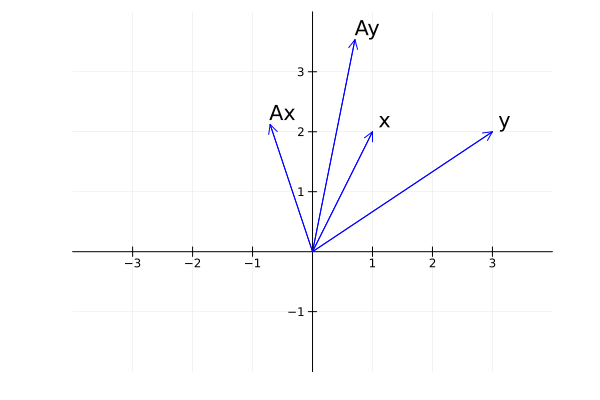

In [141]:
x = [1, 2]
y = [3, 2]

θ = π / 4
A = [cos(θ) -sin(θ); sin(θ) cos(θ)]

Ax = A * x
Ay = A * y

x_vals = [0 0 0 0; x[1] y[1] Ax[1] Ay[1]]
y_vals = [0 0 0 0; x[2] y[2] Ax[2] Ay[2]]

plt = plot(x_vals, y_vals, arrow = true, color = :blue,
    legend = :none, xlims = (-4, 4), ylims = (-2, 4),
    annotations = [((x .+ 0.2)..., "x"),
                ((y .+ 0.2)..., "y"),
                ((Ax .+ 0.2)..., "Ax"),
                ((Ay .+ 0.2)..., "Ay")],
    xticks = -3:1:3, yticks = -1:1:3,
    framestyle = :origin,
    aspect_ratio = :equal)

### QR factorization

- Recall in the [Gram-Schmidt algorithm](https://ucla-biostat-216.github.io/2023fall/slides/02-vector/02-vector.html#how-to-orthonormalize-a-set-of-vectors-gram-schmidt-algorithm), given input vectors $\mathbf{a}_1, \ldots, \mathbf{a}_k \in \mathbb{R}^n$, the Gram-Schmidt algorithm outputs orthonormal vectors $\mathbf{q}_1, \ldots, \mathbf{q}_k$.

    This can be compactly expressed as
$$
\mathbf{A} = \mathbf{Q} \mathbf{R},
$$
where $\mathbf{A} = (\mathbf{a}_1 \, \cdots \, \mathbf{a}_k) \in \mathbb{R}^{n \times k}$, $\mathbf{Q} = (\mathbf{q}_1 \, \cdots \, \mathbf{q}_k) \in \mathbb{R}^{n \times k}$ satisfying $\mathbf{Q}'\mathbf{Q} = \mathbf{I}_k$ ($\mathbf{Q}$ has orthonormal columns), and $\mathbf{R} \in \mathbb{R}^{k \times k}$ is an upper triangular matrix with positive diagonal elements.

- What are the entries in $\mathbf{R}$? In the $i$-th iteration of the Gram-Schmidt algorithm
\begin{eqnarray*}
\text{Orthogonalization step: } & & \tilde{\mathbf{q}}_i = \mathbf{a}_i - (\mathbf{q}_1' \mathbf{a}_i) \mathbf{q}_1 - \cdots - (\mathbf{q}_{i-1}' \mathbf{a}_i) \mathbf{q}_{i-1} \\
\text{Normalization step: } & & \mathbf{q}_i = \tilde{\mathbf{q}}_i / \|\tilde{\mathbf{q}}_i\|.
\end{eqnarray*}
Therefore, 
$$
\mathbf{a}_i =  (\mathbf{q}_1' \mathbf{a}_i) \mathbf{q}_1 + \cdots + (\mathbf{q}_{i-1}' \mathbf{a}_i) \mathbf{q}_{i-1} + \|\tilde{\mathbf{q}}_i\| \mathbf{q}_i.
$$
This tells us $R_{ij} = \mathbf{q}_i' \mathbf{a}_j$ for $i < j$ and $R_{ii} = \|\tilde{\mathbf{q}}_i\|$.

- Thus overall Gram-Schmidt algorithm performs
$$
\mathbf{A} = \begin{pmatrix} | & | & & | & | \\ \mathbf{a}_1 & \mathbf{a}_2 & \cdots & \mathbf{a}_{k-1} & \mathbf{a}_k \\ | & | & & | & | \end{pmatrix} = \begin{pmatrix} | & | & & | & | \\ \mathbf{q}_1 & \mathbf{q}_2 & \cdots & \mathbf{q}_{k-1} & \mathbf{q}_k \\ | & | & & | & | \end{pmatrix} \begin{pmatrix} 
\|\tilde{\mathbf{q}}_1\| & \mathbf{q}_1'\mathbf{a}_2 & \cdots & \mathbf{q}_1' \mathbf{a}_{k-1}  & \mathbf{q}_1' \mathbf{a}_k \\
& \|\tilde{\mathbf{q}}_2\| & \cdots & \mathbf{q}_2' \mathbf{a}_{k-1} & \mathbf{q}_2' \mathbf{a}_k \\
& & \ddots & \vdots & \vdots \\
& & & \|\tilde{\mathbf{q}}_{k-1}\| & \mathbf{q}_{k-1}' \mathbf{a}_k \\
& & & & \|\tilde{\mathbf{q}}_k\|
\end{pmatrix} = \mathbf{Q} \mathbf{R}.
$$

In [142]:
# HW2: BV 5.6
n = 5
A = [i ≤ j ? 1 : 0 for i in 1:n, j in 1:n]

5×5 Matrix{Int64}:
 1  1  1  1  1
 0  1  1  1  1
 0  0  1  1  1
 0  0  0  1  1
 0  0  0  0  1

In [143]:
# in computer, QR decomposition is performed by some algorithm other than Gram-Schmidt
qr(A)

LinearAlgebra.QRCompactWY{Float64, Matrix{Float64}, Matrix{Float64}}
Q factor: 5×5 LinearAlgebra.QRCompactWYQ{Float64, Matrix{Float64}, Matrix{Float64}}
R factor:
5×5 Matrix{Float64}:
 1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0
 0.0  0.0  1.0  1.0  1.0
 0.0  0.0  0.0  1.0  1.0
 0.0  0.0  0.0  0.0  1.0